/var/folders/j3/kwprsg3s3_zf9_90gxwcknm00000gn/T/ipykernel_48316/480167393.py:23: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=df_melted, x="Month", y="Rainfall", hue="Location", ci=None)


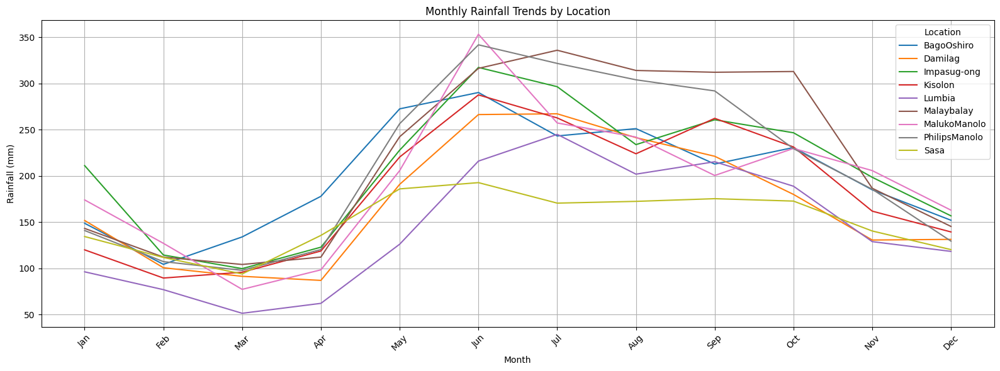

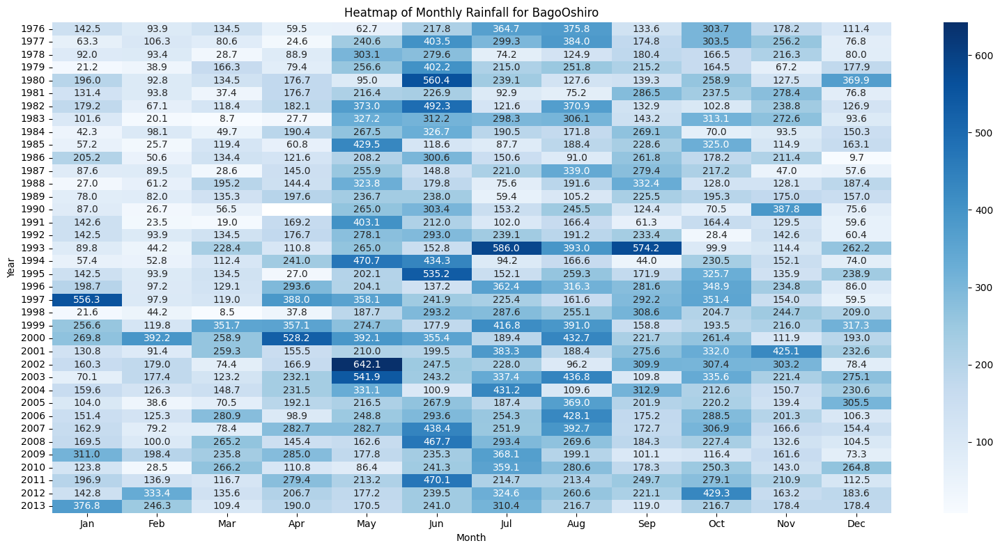

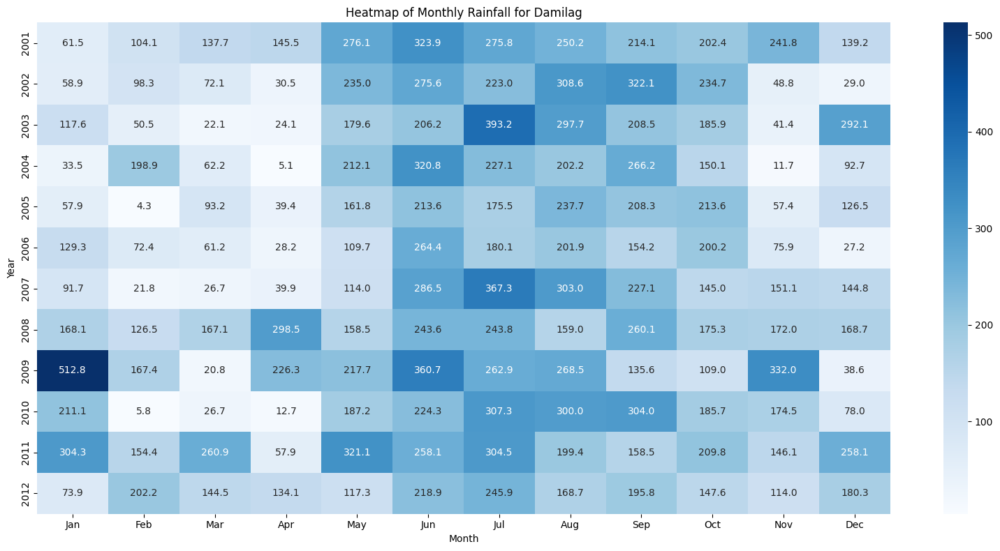

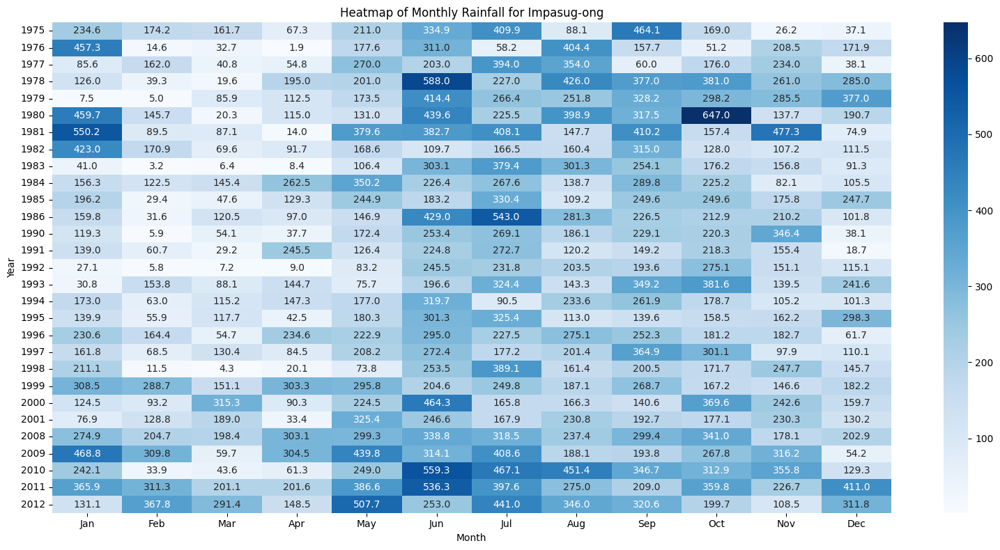

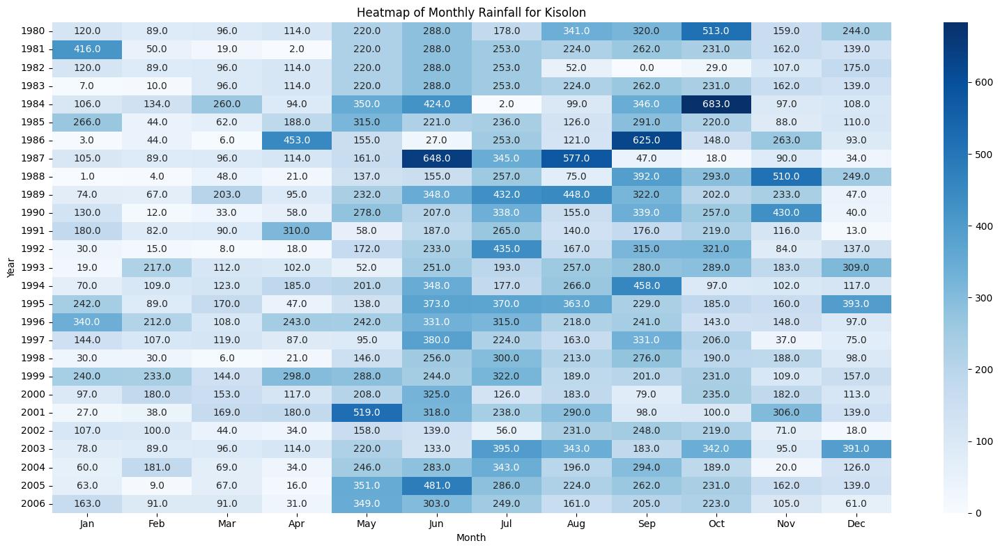

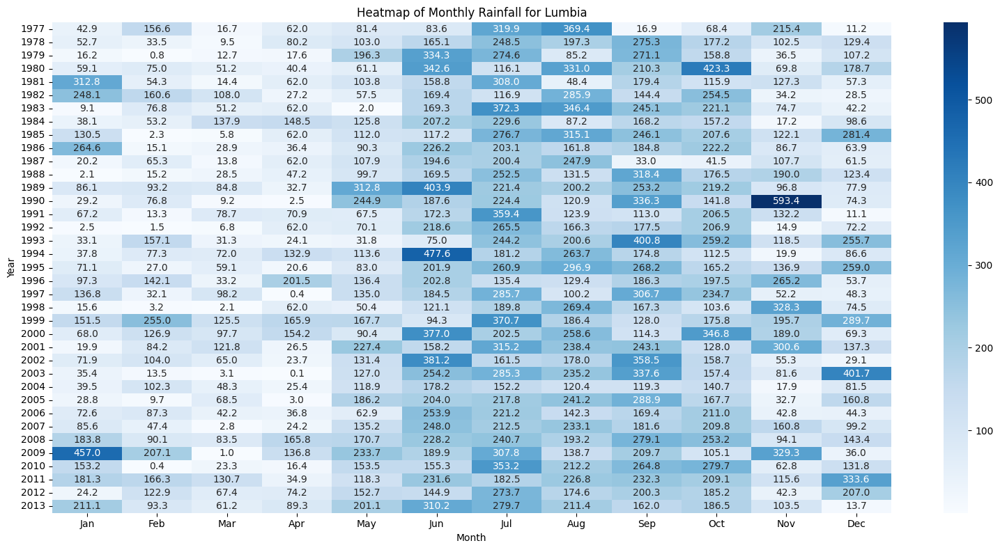

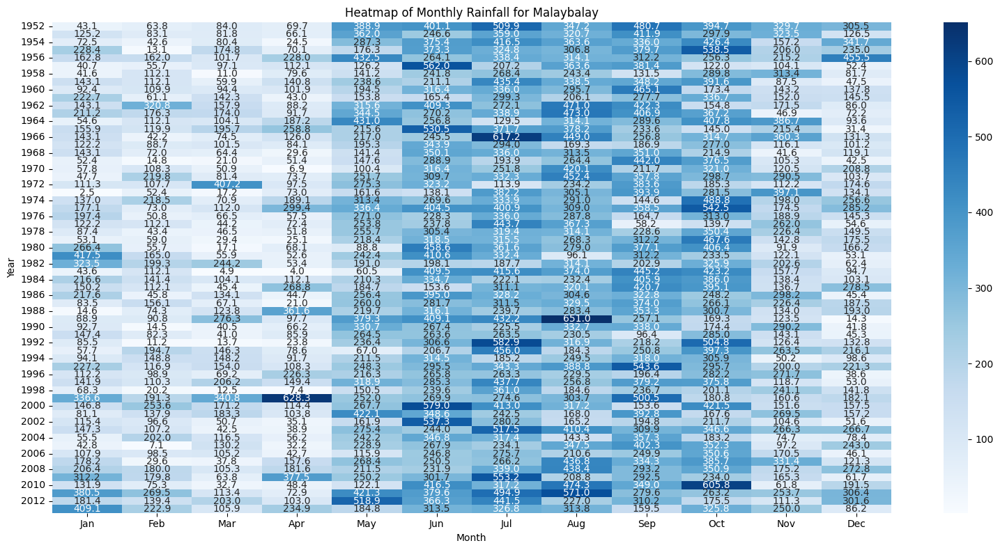

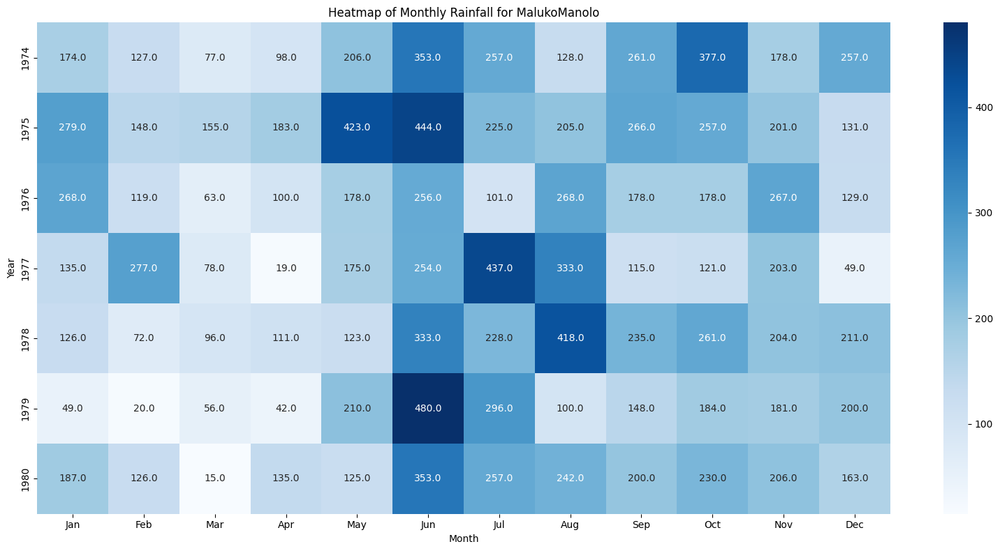

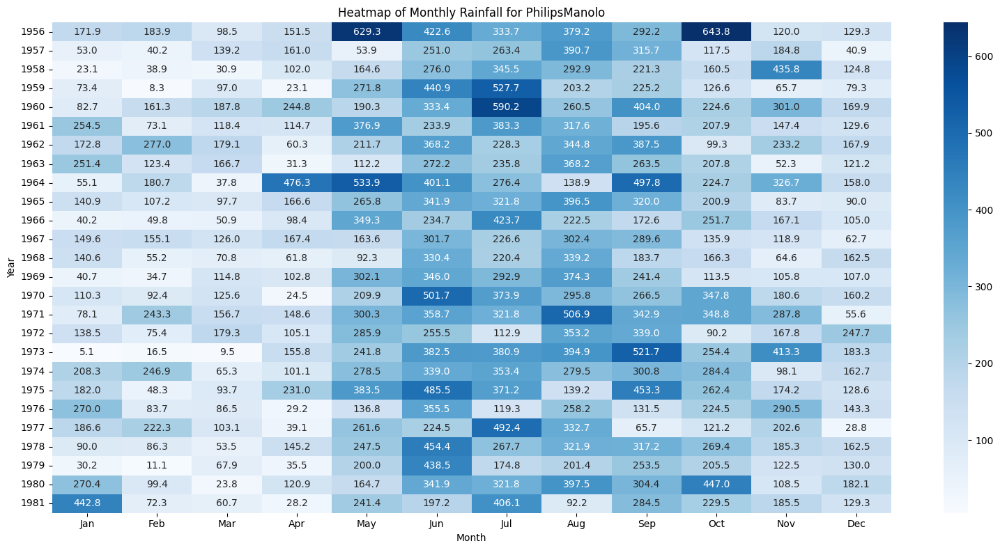

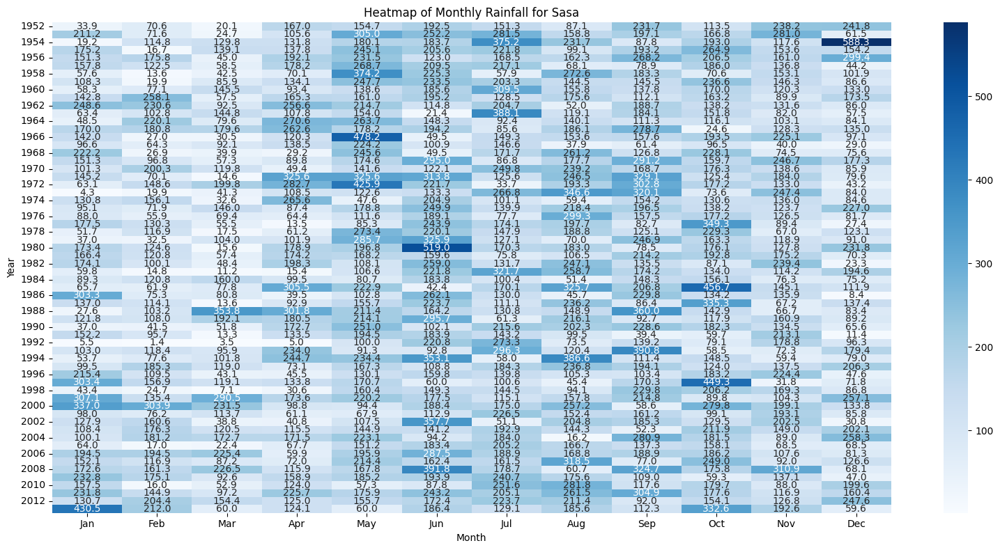

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the CSV file
df = pd.read_csv("RAINFALL.csv")

# Melt the wide format into long format
df_melted = df.melt(id_vars=["Location", "Year"], 
                    var_name="Month", 
                    value_name="Rainfall")

# Ensure proper month order for plotting
month_order = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", 
               "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
df_melted["Month"] = pd.Categorical(df_melted["Month"], categories=month_order, ordered=True)

# Sort values for better plotting
df_melted.sort_values(by=["Location", "Year", "Month"], inplace=True)

# Line Plot: Monthly rainfall per location (aggregated)
plt.figure(figsize=(16, 6))
sns.lineplot(data=df_melted, x="Month", y="Rainfall", hue="Location", ci=None)
plt.title("Monthly Rainfall Trends by Location")
plt.ylabel("Rainfall (mm)")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# Optional: Heatmap per location (one at a time)
locations = df_melted['Location'].unique()

for location in locations:
    pivot_table = df_melted[df_melted['Location'] == location].pivot(index='Year', columns='Month', values='Rainfall')
    
    plt.figure(figsize=(16, 8))
    sns.heatmap(pivot_table, annot=True, fmt=".1f", cmap="Blues")
    plt.title(f"Heatmap of Monthly Rainfall for {location}")
    plt.ylabel("Year")
    plt.xlabel("Month")
    plt.tight_layout()
    plt.show()


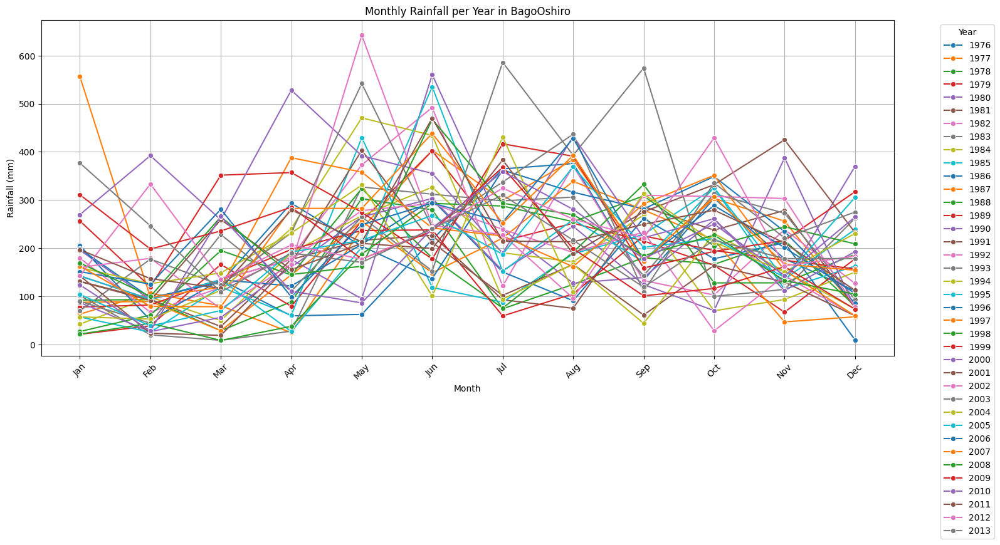

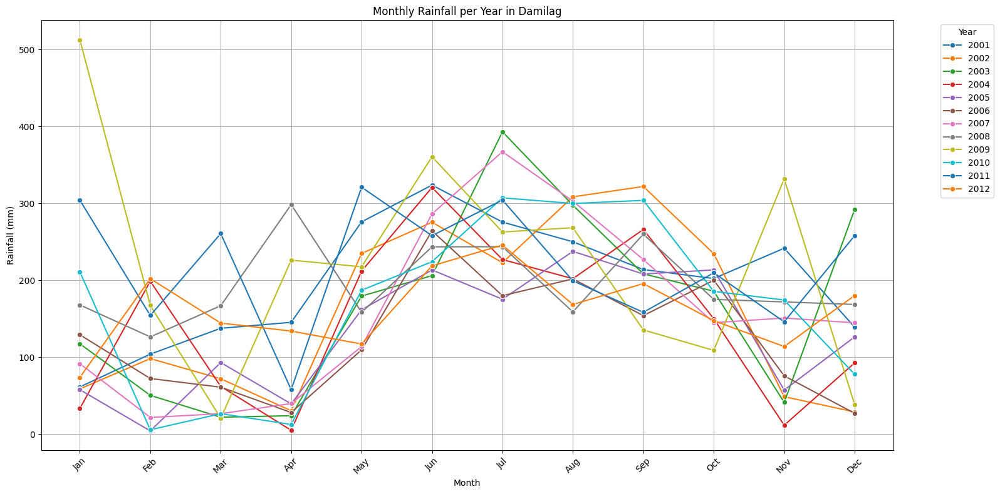

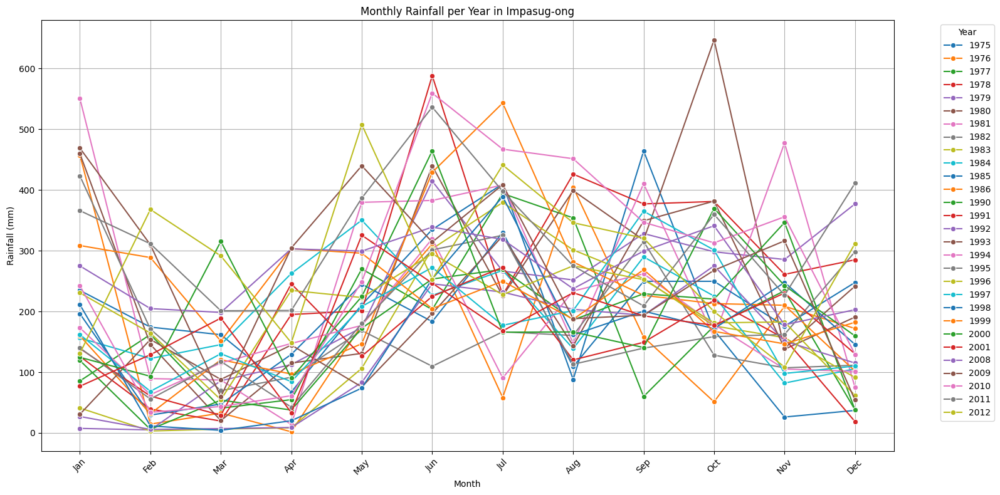

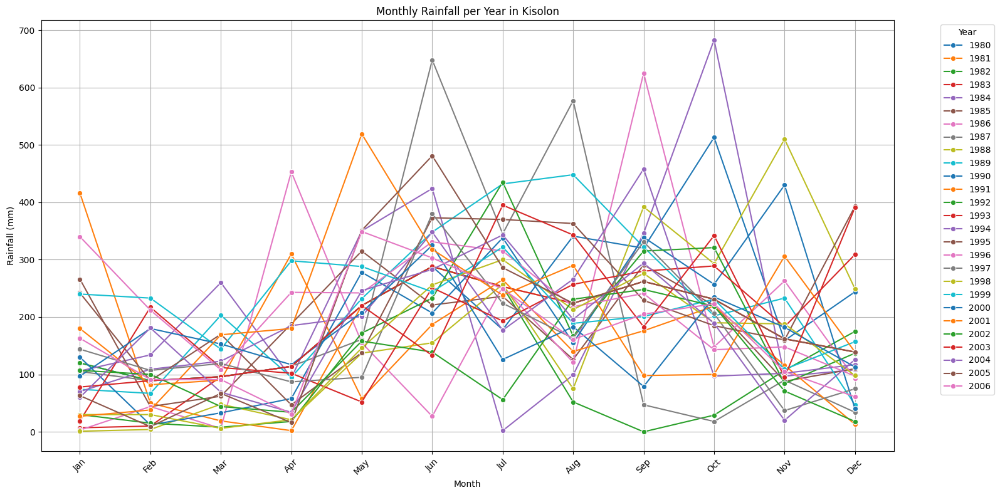

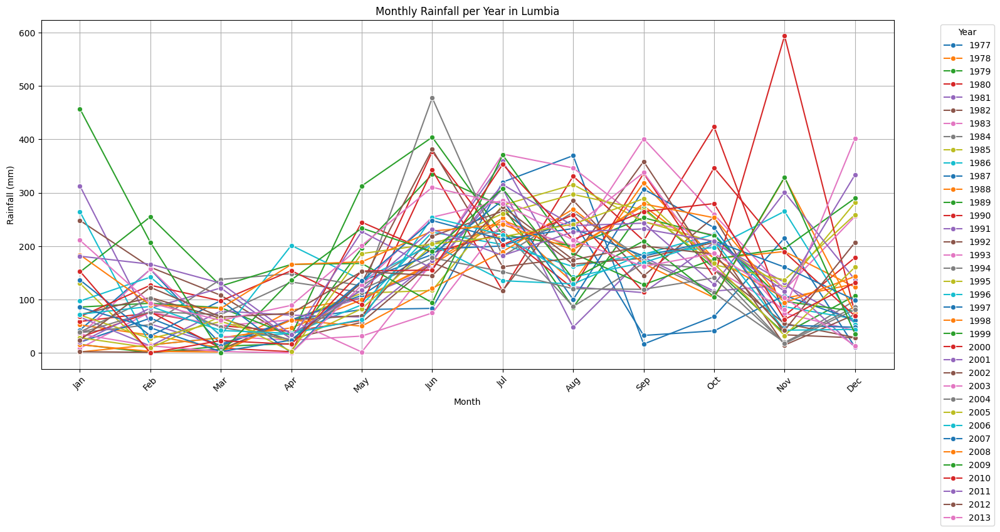

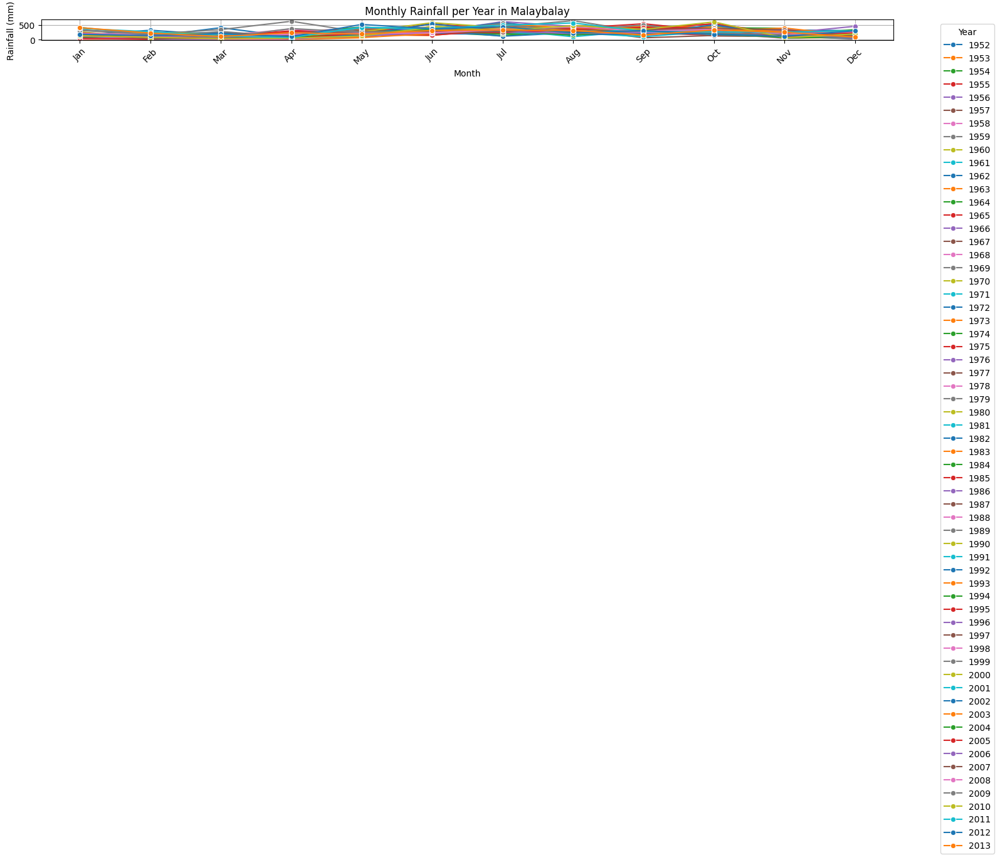

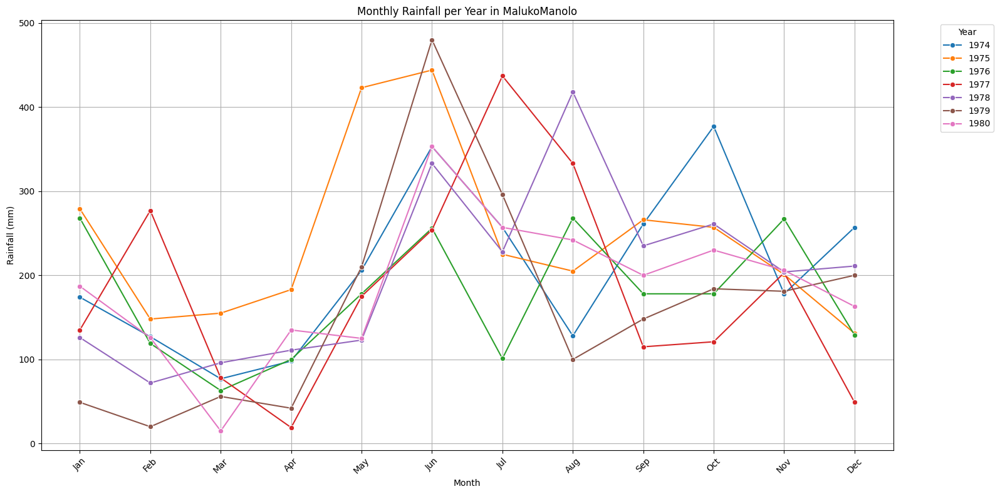

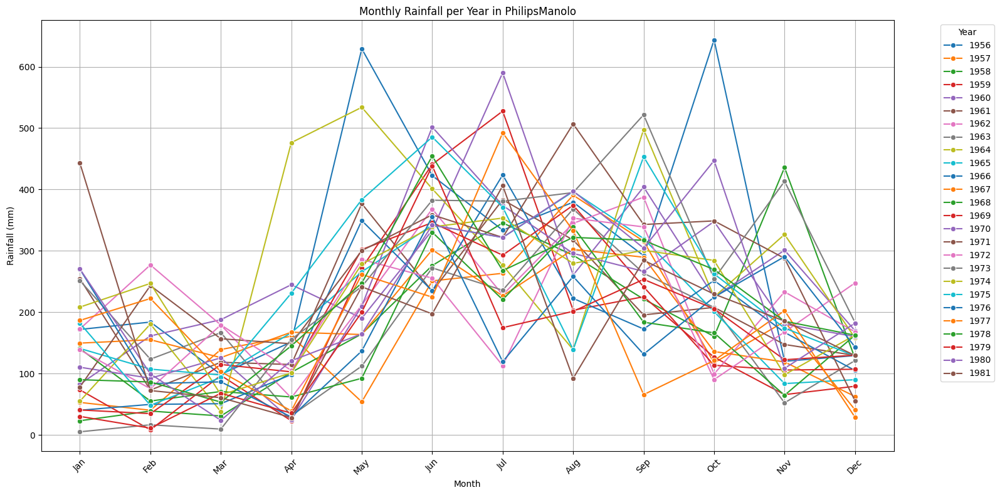

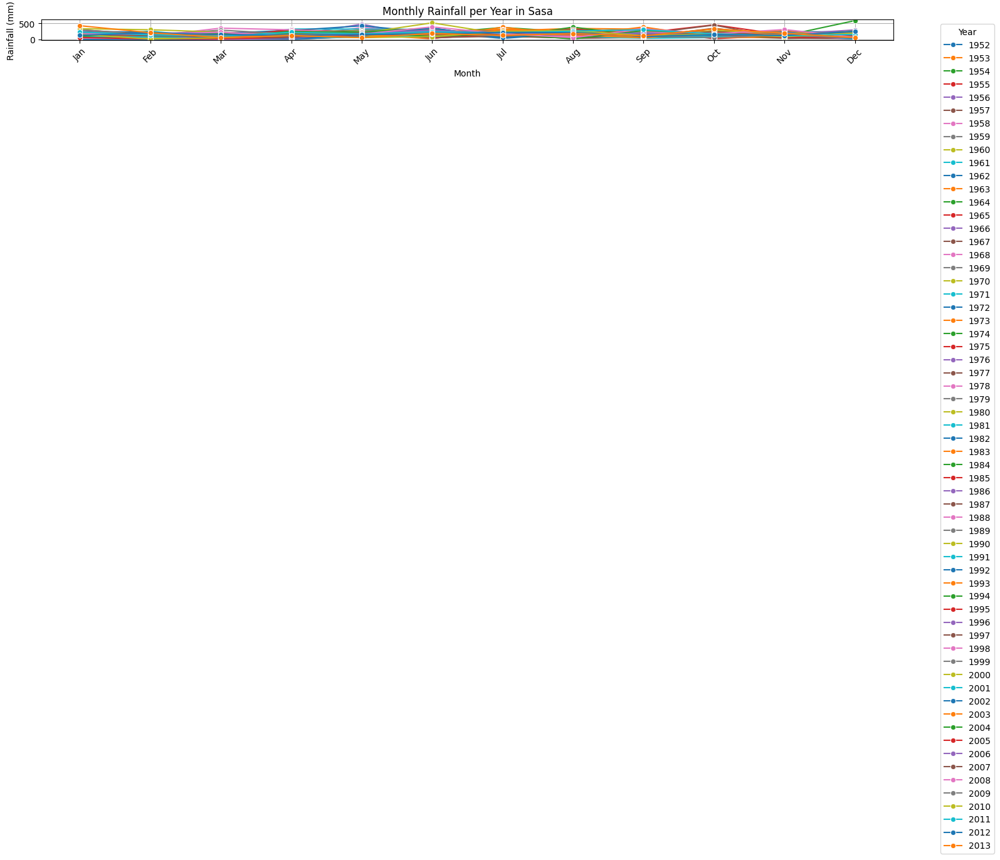

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv("RAINFALL.csv")

# Clean column names
df.columns = df.columns.str.strip()

# Melt the dataframe to long format
df_melted = df.melt(id_vars=["Location", "Year"], 
                    var_name="Month", 
                    value_name="Rainfall")

# Ensure proper month order
month_order = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", 
               "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
df_melted["Month"] = pd.Categorical(df_melted["Month"], categories=month_order, ordered=True)

# Sort for consistent plotting
df_melted = df_melted.sort_values(by=["Location", "Year", "Month"])

# Get unique locations
locations = df_melted["Location"].unique()

# Plot for each location
for location in locations:
    plt.figure(figsize=(16, 8))
    loc_data = df_melted[df_melted["Location"] == location]
    sns.lineplot(data=loc_data, x="Month", y="Rainfall", hue="Year", palette="tab10", marker="o")
    plt.title(f"Monthly Rainfall per Year in {location}")
    plt.ylabel("Rainfall (mm)")
    plt.xticks(rotation=45)
    plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


        Location  Start_Year  End_Year  Year_Count
0     BagoOshiro        1976      2013          38
1        Damilag        2001      2012          12
2    Impasug-ong        1975      2012          29
3        Kisolon        1980      2006          27
4         Lumbia        1977      2013          37
5     Malaybalay        1952      2013          62
6   MalukoManolo        1974      1980           7
7  PhilipsManolo        1956      1981          26
8           Sasa        1952      2013          62


/var/folders/j3/kwprsg3s3_zf9_90gxwcknm00000gn/T/ipykernel_48316/4241384364.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=location_summary, x="Location", y="Year_Count", palette="viridis")


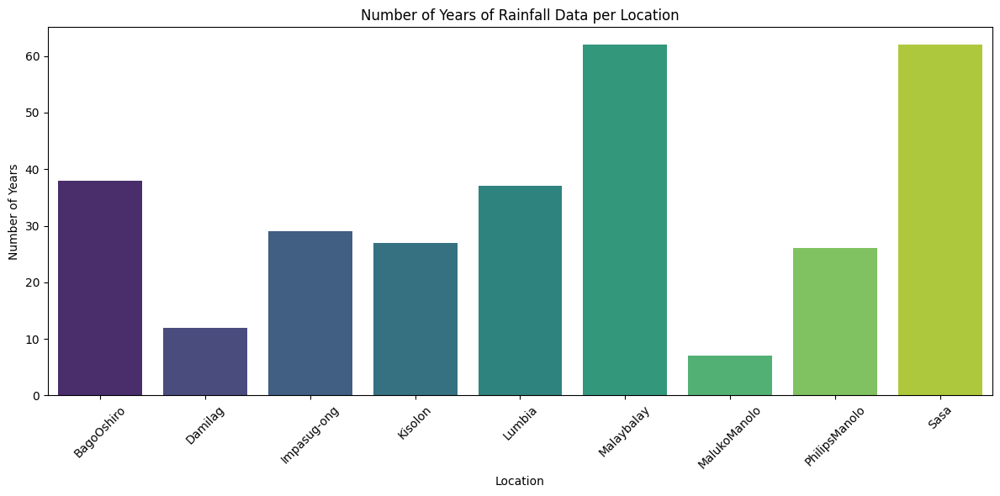

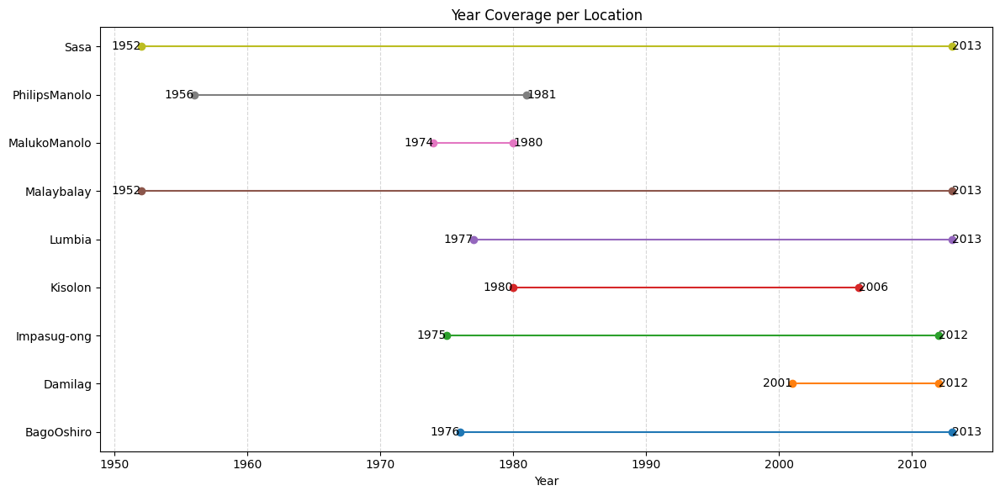

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the CSV and clean column names
df = pd.read_csv("RAINFALL.csv")
df.columns = df.columns.str.strip()

# Group by location: get year range and count
location_summary = df.groupby("Location")["Year"].agg(
    Start_Year="min",
    End_Year="max",
    Year_Count="nunique"
).reset_index()

# Print summary table
print(location_summary)

# Plot 1: Bar chart - How many years per location
plt.figure(figsize=(12, 6))
sns.barplot(data=location_summary, x="Location", y="Year_Count", palette="viridis")
plt.title("Number of Years of Rainfall Data per Location")
plt.ylabel("Number of Years")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot 2: Timeline bar (like Gantt chart)
plt.figure(figsize=(12, 6))
for i, row in location_summary.iterrows():
    plt.plot([row["Start_Year"], row["End_Year"]], [i, i], marker='o', label=row["Location"])
    plt.text(row["Start_Year"], i, str(row["Start_Year"]), va='center', ha='right')
    plt.text(row["End_Year"], i, str(row["End_Year"]), va='center', ha='left')

plt.yticks(range(len(location_summary)), location_summary["Location"])
plt.title("Year Coverage per Location")
plt.xlabel("Year")
plt.grid(True, axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


✅ Summary saved to: location_year_coverage_summary.csv


/var/folders/j3/kwprsg3s3_zf9_90gxwcknm00000gn/T/ipykernel_52719/4122372294.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=location_summary.sort_values("Year_Count", ascending=False),


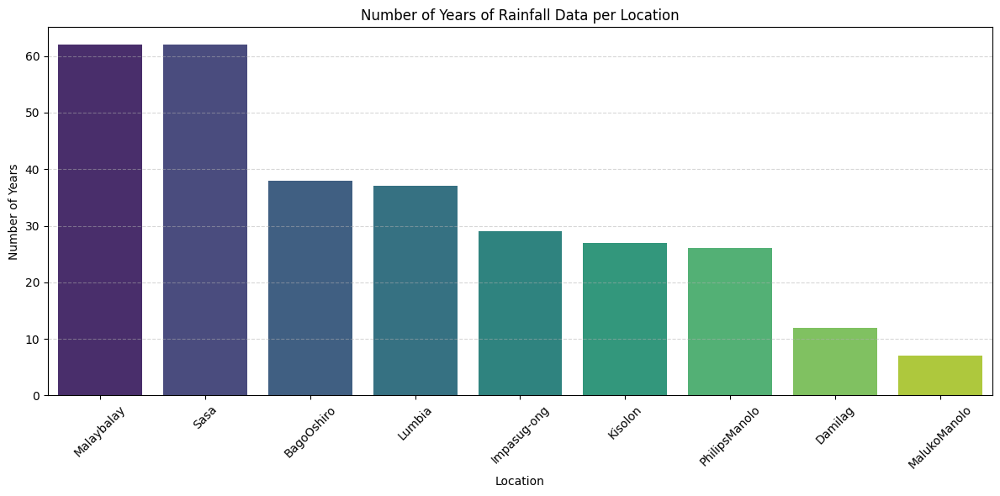

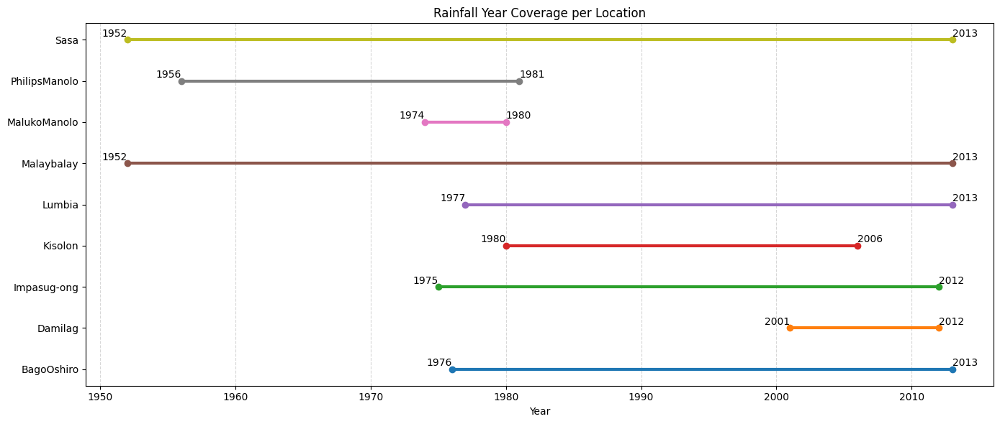

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load and clean the dataset
df = pd.read_csv("RAINFALL.csv")
df.columns = df.columns.str.strip()

# Summarize per location: Start year, End year, and Year count
location_summary = df.groupby("Location")["Year"].agg(
    Start_Year="min",
    End_Year="max",
    Year_Count="nunique"
).reset_index()

# Save the summary to a CSV file
location_summary.to_csv("location_year_coverage_summary.csv", index=False)
print("✅ Summary saved to: location_year_coverage_summary.csv")

# --- Plot 1: Bar chart of number of years per location ---
plt.figure(figsize=(12, 6))
sns.barplot(data=location_summary.sort_values("Year_Count", ascending=False), 
            x="Location", y="Year_Count", palette="viridis")
plt.title("Number of Years of Rainfall Data per Location")
plt.ylabel("Number of Years")
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.show()

# --- Plot 2: Timeline of coverage per location (Gantt-like plot) ---
plt.figure(figsize=(14, 6))
for i, row in location_summary.iterrows():
    plt.plot([row["Start_Year"], row["End_Year"]], [i, i], marker='o', linewidth=3)
    plt.text(row["Start_Year"], i + 0.15, str(row["Start_Year"]), ha='right', va='center')
    plt.text(row["End_Year"], i + 0.15, str(row["End_Year"]), ha='left', va='center')

plt.yticks(range(len(location_summary)), location_summary["Location"])
plt.title("Rainfall Year Coverage per Location")
plt.xlabel("Year")
plt.grid(True, axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Training ARIMA...
Training LSTM...
Training GRU...
Training LSTM–GRU Hybrid...

📊 Model Evaluation (Next 12 Months)

ARIMA     → RMSE: 103.69 | MAE: 82.60
LSTM      → RMSE: 108.95 | MAE: 88.53
GRU       → RMSE: 110.84 | MAE: 81.75
LSTM-GRU  → RMSE: 110.88 | MAE: 83.75


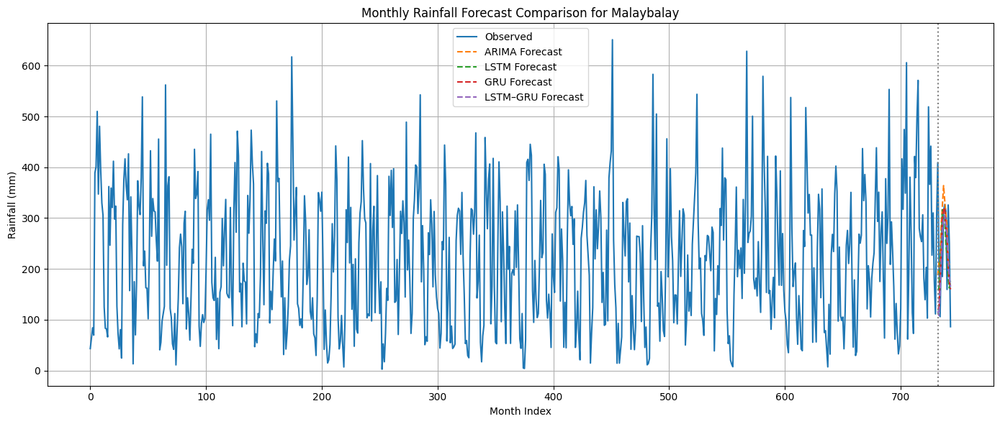

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense
from statsmodels.tsa.arima.model import ARIMA
import warnings
warnings.filterwarnings("ignore")

# === STEP 1: Load and preprocess ===
df = pd.read_csv("RAINFALL.csv")
df.columns = df.columns.str.strip()

# Use one location: e.g., Malaybalay
location = "Malaybalay"
df_loc = df[df['Location'] == location].copy()

# Only keep years with full data
df_loc.dropna(inplace=True)

# Sort by year and get monthly time series
df_monthly = df_loc.sort_values("Year").loc[:, "Jan":"Dec"].values.flatten()
years = df_loc["Year"].values
year_index = np.repeat(years, 12)
month_index = np.tile(range(1, 13), len(years))

# Combine into DataFrame
ts_df = pd.DataFrame({
    "Year": year_index,
    "Month": month_index,
    "Rainfall": df_monthly
}).reset_index(drop=True)

# Hold out last 12 months for evaluation
ts_train = ts_df.iloc[:-12]
ts_test = ts_df.iloc[-12:]

# Normalize
scaler = MinMaxScaler()
rain_scaled = scaler.fit_transform(ts_train[["Rainfall"]])

# Create sequences
def create_sequences(data, look_back=12):
    X, y = [], []
    for i in range(look_back, len(data)):
        X.append(data[i-look_back:i])
        y.append(data[i])
    return np.array(X), np.array(y)

X_seq, y_seq = create_sequences(rain_scaled, look_back=12)

# === STEP 2: ARIMA ===
print("Training ARIMA...")
rain_series = ts_train["Rainfall"]
arima_model = ARIMA(rain_series, order=(12, 1, 0)).fit()
arima_forecast = arima_model.forecast(steps=12)
arima_rmse = np.sqrt(mean_squared_error(ts_test["Rainfall"], arima_forecast))
arima_mae = mean_absolute_error(ts_test["Rainfall"], arima_forecast)

# === STEP 3: LSTM ===
print("Training LSTM...")
X_lstm = X_seq.reshape((X_seq.shape[0], X_seq.shape[1], 1))
lstm_model = Sequential([
    LSTM(64, input_shape=(X_lstm.shape[1], 1)),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_lstm, y_seq, epochs=100, verbose=0)

def forecast_dl_model(model, last_seq, steps=12):
    forecast = []
    seq = last_seq.copy()
    for _ in range(steps):
        pred = model.predict(seq.reshape(1, -1, 1), verbose=0)[0][0]
        forecast.append(pred)
        seq = np.append(seq[1:], pred)
    return forecast

last_seq = rain_scaled[-12:].flatten()
lstm_forecast = scaler.inverse_transform(np.array(forecast_dl_model(lstm_model, last_seq)).reshape(-1, 1)).flatten()
lstm_rmse = np.sqrt(mean_squared_error(ts_test["Rainfall"], lstm_forecast))
lstm_mae = mean_absolute_error(ts_test["Rainfall"], lstm_forecast)

# === STEP 4: GRU ===
print("Training GRU...")
gru_model = Sequential([
    GRU(64, input_shape=(X_lstm.shape[1], 1)),
    Dense(1)
])
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_lstm, y_seq, epochs=100, verbose=0)

gru_forecast = scaler.inverse_transform(np.array(forecast_dl_model(gru_model, last_seq)).reshape(-1, 1)).flatten()
gru_rmse = np.sqrt(mean_squared_error(ts_test["Rainfall"], gru_forecast))
gru_mae = mean_absolute_error(ts_test["Rainfall"], gru_forecast)

# === STEP 5: Hybrid (LSTM-GRU) ===
print("Training LSTM–GRU Hybrid...")
hybrid_model = Sequential([
    LSTM(32, return_sequences=True, input_shape=(X_lstm.shape[1], 1)),
    GRU(32),
    Dense(1)
])
hybrid_model.compile(optimizer='adam', loss='mse')
hybrid_model.fit(X_lstm, y_seq, epochs=100, verbose=0)

hybrid_forecast = scaler.inverse_transform(np.array(forecast_dl_model(hybrid_model, last_seq)).reshape(-1, 1)).flatten()
hybrid_rmse = np.sqrt(mean_squared_error(ts_test["Rainfall"], hybrid_forecast))
hybrid_mae = mean_absolute_error(ts_test["Rainfall"], hybrid_forecast)

# === STEP 6: Evaluation Summary ===
print("\n📊 Model Evaluation (Next 12 Months)\n")
print(f"ARIMA     → RMSE: {arima_rmse:.2f} | MAE: {arima_mae:.2f}")
print(f"LSTM      → RMSE: {lstm_rmse:.2f} | MAE: {lstm_mae:.2f}")
print(f"GRU       → RMSE: {gru_rmse:.2f} | MAE: {gru_mae:.2f}")
print(f"LSTM-GRU  → RMSE: {hybrid_rmse:.2f} | MAE: {hybrid_mae:.2f}")

# === STEP 7: Visualization ===
plt.figure(figsize=(14, 6))
plt.plot(ts_df["Rainfall"], label="Observed")
plt.plot(range(len(ts_df)-12, len(ts_df)), arima_forecast, label="ARIMA Forecast", linestyle='--')
plt.plot(range(len(ts_df)-12, len(ts_df)), lstm_forecast, label="LSTM Forecast", linestyle='--')
plt.plot(range(len(ts_df)-12, len(ts_df)), gru_forecast, label="GRU Forecast", linestyle='--')
plt.plot(range(len(ts_df)-12, len(ts_df)), hybrid_forecast, label="LSTM–GRU Forecast", linestyle='--')
plt.axvline(len(ts_df)-12, color='gray', linestyle=':')
plt.title(f"Monthly Rainfall Forecast Comparison for {location}")
plt.ylabel("Rainfall (mm)")
plt.xlabel("Month Index")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Training ARIMA...
Training LSTM...
Training GRU...
Training LSTM–GRU...

📊 HINDCAST EVALUATION (1952–1955)
ARIMA      → RMSE: 386.69 | MAE: 310.59
LSTM       → RMSE: 553.36 | MAE: 507.71
GRU        → RMSE: 583.18 | MAE: 542.18
LSTM-GRU   → RMSE: 522.63 | MAE: 477.52

📊 FORECAST EVALUATION (2010–2013)
ARIMA      → RMSE: 574.61 | MAE: 428.42
LSTM       → RMSE: 719.70 | MAE: 611.81
GRU        → RMSE: 820.67 | MAE: 718.84
LSTM-GRU   → RMSE: 731.88 | MAE: 623.61


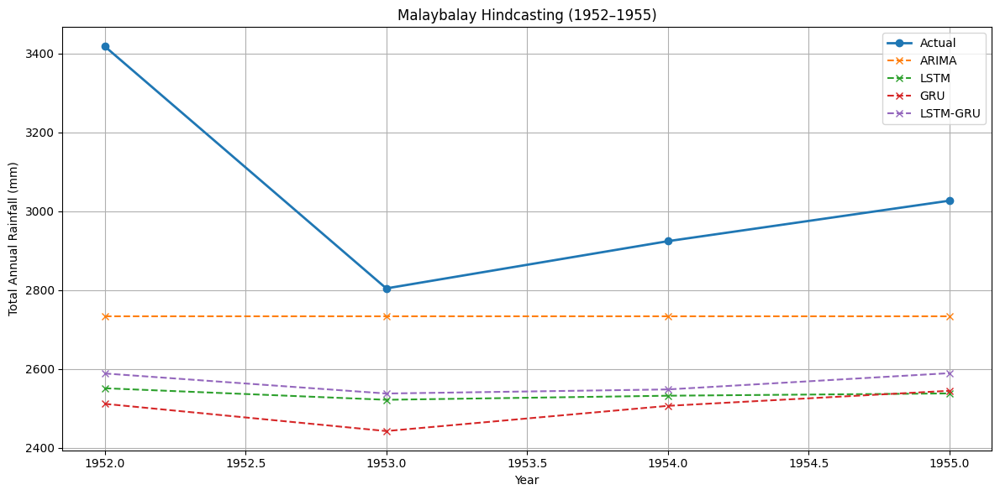

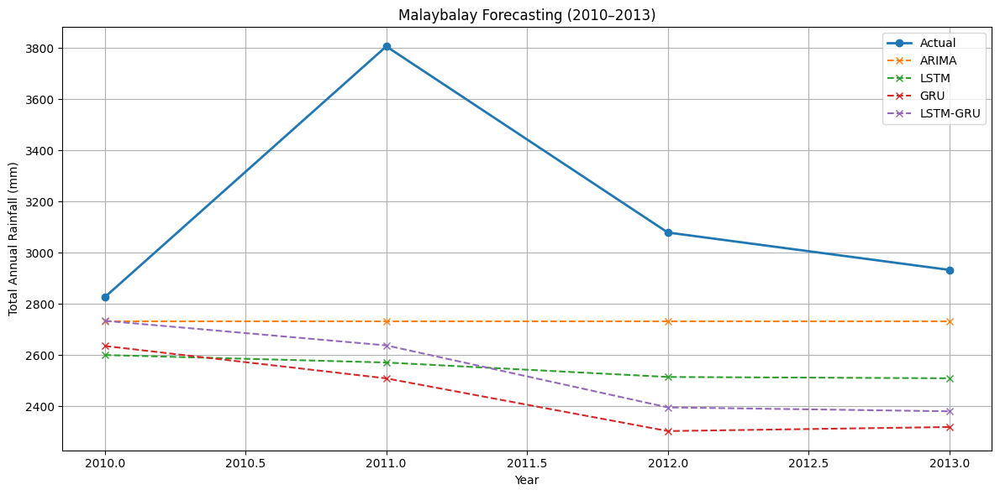

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense
from statsmodels.tsa.arima.model import ARIMA
import warnings
warnings.filterwarnings("ignore")

# === STEP 1: Load and preprocess ===
df = pd.read_csv("RAINFALL.csv")
df.columns = df.columns.str.strip()
location = "Malaybalay"
df_loc = df[df['Location'] == location].copy()
df_loc['TotalRainfall'] = df_loc.loc[:, 'Jan':'Dec'].sum(axis=1)

# Create a complete range with missing years as NaN
full_years = pd.DataFrame({'Year': range(df_loc['Year'].min(), df_loc['Year'].max() + 1)})
df_merged = full_years.merge(df_loc[['Year', 'TotalRainfall']], on='Year', how='left')

# Store original values for evaluation
true_early = df_merged[df_merged['Year'].between(1952, 1955)]['TotalRainfall'].values
true_late = df_merged[df_merged['Year'].between(2010, 2013)]['TotalRainfall'].values

# Mask years 1952–1955 and 2010–2013 as missing (for testing)
df_merged.loc[df_merged['Year'].between(1952, 1955), 'TotalRainfall'] = np.nan
df_merged.loc[df_merged['Year'].between(2010, 2013), 'TotalRainfall'] = np.nan

# Normalize
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_merged[['TotalRainfall']])

# === Sequence Preparation ===
def create_sequences(data, look_back=5):
    X, y = [], []
    for i in range(look_back, len(data)):
        if not np.isnan(data[i-look_back:i+1]).any():
            X.append(data[i-look_back:i])
            y.append(data[i])
    return np.array(X), np.array(y)

X_seq, y_seq = create_sequences(scaled_data, look_back=5)

# === STEP 2: ARIMA ===
print("Training ARIMA...")
train_series = df_merged['TotalRainfall'].dropna()
arima_model = ARIMA(train_series, order=(5, 1, 0)).fit()

# Hindcast (1952–1955)
hindcast_years = [1952, 1953, 1954, 1955]
hindcast_arima = arima_model.predict(start=1952, end=1955)

# Forecast (2010–2013)
forecast_arima = arima_model.predict(start=2010, end=2013)

# === STEP 3: LSTM ===
print("Training LSTM...")
X_lstm = X_seq.reshape((X_seq.shape[0], X_seq.shape[1], 1))
lstm_model = Sequential([
    LSTM(50, input_shape=(5, 1)),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_lstm, y_seq, epochs=100, verbose=0)

def predict_years(model, start_index, steps):
    pred = []
    seq = scaled_data[start_index-5:start_index].flatten()
    for _ in range(steps):
        p = model.predict(seq.reshape(1, -1, 1), verbose=0)[0][0]
        pred.append(p)
        seq = np.append(seq[1:], p)
    return scaler.inverse_transform(np.array(pred).reshape(-1, 1)).flatten()

# Forecast 2010–2013
start_index_forecast = df_merged[df_merged['Year'] == 2010].index[0]
lstm_forecast = predict_years(lstm_model, start_index_forecast, 4)

# Hindcast 1952–1955 (reverse)
start_index_hindcast = df_merged[df_merged['Year'] == 1956].index[0]
hind_seq = scaled_data[start_index_hindcast:start_index_hindcast+5].flatten()
hindcast_lstm = []
for _ in range(4):
    pred = lstm_model.predict(hind_seq.reshape(1, -1, 1), verbose=0)[0][0]
    hindcast_lstm.insert(0, pred)  # reverse order
    hind_seq = np.insert(hind_seq[:-1], 0, pred)
hindcast_lstm = scaler.inverse_transform(np.array(hindcast_lstm).reshape(-1, 1)).flatten()

# === STEP 4: GRU ===
print("Training GRU...")
gru_model = Sequential([
    GRU(50, input_shape=(5, 1)),
    Dense(1)
])
gru_model.compile(optimizer='adam', loss='mse')
gru_model.fit(X_lstm, y_seq, epochs=100, verbose=0)

gru_forecast = predict_years(gru_model, start_index_forecast, 4)

hind_seq = scaled_data[start_index_hindcast:start_index_hindcast+5].flatten()
hindcast_gru = []
for _ in range(4):
    pred = gru_model.predict(hind_seq.reshape(1, -1, 1), verbose=0)[0][0]
    hindcast_gru.insert(0, pred)
    hind_seq = np.insert(hind_seq[:-1], 0, pred)
hindcast_gru = scaler.inverse_transform(np.array(hindcast_gru).reshape(-1, 1)).flatten()

# === STEP 5: Hybrid (LSTM-GRU) ===
print("Training LSTM–GRU...")
hybrid_model = Sequential([
    LSTM(32, return_sequences=True, input_shape=(5, 1)),
    GRU(32),
    Dense(1)
])
hybrid_model.compile(optimizer='adam', loss='mse')
hybrid_model.fit(X_lstm, y_seq, epochs=100, verbose=0)

hybrid_forecast = predict_years(hybrid_model, start_index_forecast, 4)

hind_seq = scaled_data[start_index_hindcast:start_index_hindcast+5].flatten()
hindcast_hybrid = []
for _ in range(4):
    pred = hybrid_model.predict(hind_seq.reshape(1, -1, 1), verbose=0)[0][0]
    hindcast_hybrid.insert(0, pred)
    hind_seq = np.insert(hind_seq[:-1], 0, pred)
hindcast_hybrid = scaler.inverse_transform(np.array(hindcast_hybrid).reshape(-1, 1)).flatten()

# === STEP 6: Evaluation ===
def eval_metrics(true, pred, label):
    rmse = np.sqrt(mean_squared_error(true, pred))
    mae = mean_absolute_error(true, pred)
    print(f"{label:<10} → RMSE: {rmse:.2f} | MAE: {mae:.2f}")

print("\n📊 HINDCAST EVALUATION (1952–1955)")
eval_metrics(true_early, hindcast_arima, "ARIMA")
eval_metrics(true_early, hindcast_lstm, "LSTM")
eval_metrics(true_early, hindcast_gru, "GRU")
eval_metrics(true_early, hindcast_hybrid, "LSTM-GRU")

print("\n📊 FORECAST EVALUATION (2010–2013)")
eval_metrics(true_late, forecast_arima, "ARIMA")
eval_metrics(true_late, lstm_forecast, "LSTM")
eval_metrics(true_late, gru_forecast, "GRU")
eval_metrics(true_late, hybrid_forecast, "LSTM-GRU")


# === STEP 7: Visualization ===
def plot_prediction(years, true, preds_dict, title):
    plt.figure(figsize=(12, 6))
    plt.plot(years, true, label="Actual", marker='o', linewidth=2)
    for label, preds in preds_dict.items():
        plt.plot(years, preds, label=label, marker='x', linestyle='--')
    plt.title(title)
    plt.xlabel("Year")
    plt.ylabel("Total Annual Rainfall (mm)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Plot Hindcast
hindcast_years = list(range(1952, 1956))
hindcast_preds = {
    "ARIMA": hindcast_arima,
    "LSTM": hindcast_lstm,
    "GRU": hindcast_gru,
    "LSTM-GRU": hindcast_hybrid
}
plot_prediction(hindcast_years, true_early, hindcast_preds, f"{location} Hindcasting (1952–1955)")

# Plot Forecast
forecast_years = list(range(2010, 2014))
forecast_preds = {
    "ARIMA": forecast_arima,
    "LSTM": lstm_forecast,
    "GRU": gru_forecast,
    "LSTM-GRU": hybrid_forecast
}
plot_prediction(forecast_years, true_late, forecast_preds, f"{location} Forecasting (2010–2013)")



Processing Jan...
Processing Feb...
Processing Mar...
Processing Apr...
Processing May...
Processing Jun...
Processing Jul...
Processing Aug...
Processing Sep...
Processing Oct...
Processing Nov...
Processing Dec...

📊 RMSE and MAE per Month:
Jan: RMSE = 150.40, MAE = 113.67
Feb: RMSE = 84.51, MAE = 67.16
Mar: RMSE = 76.42, MAE = 51.05
Apr: RMSE = 111.15, MAE = 95.23
May: RMSE = 167.63, MAE = 153.00
Jun: RMSE = 158.06, MAE = 117.98
Jul: RMSE = 159.68, MAE = 126.14
Aug: RMSE = 158.32, MAE = 116.60
Sep: RMSE = 160.06, MAE = 109.24
Oct: RMSE = 238.74, MAE = 183.23
Nov: RMSE = 122.49, MAE = 111.62
Dec: RMSE = 150.71, MAE = 138.47


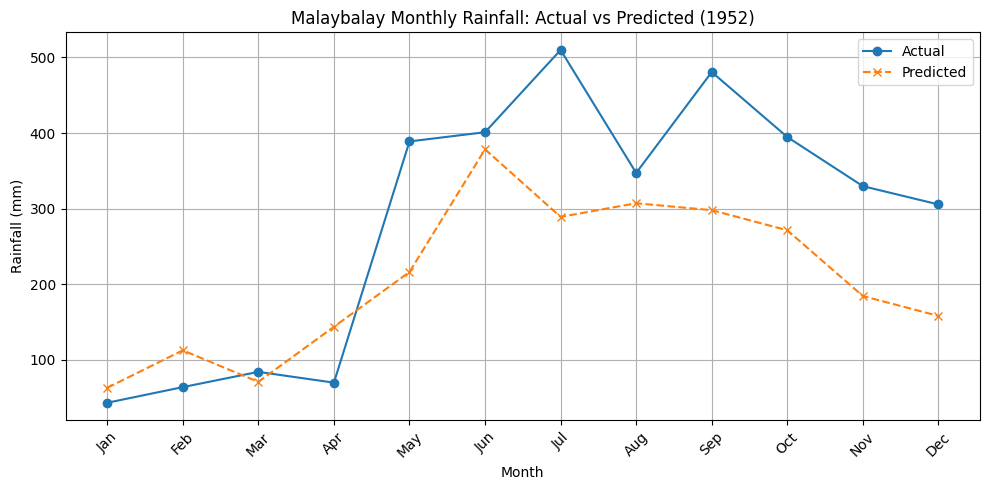

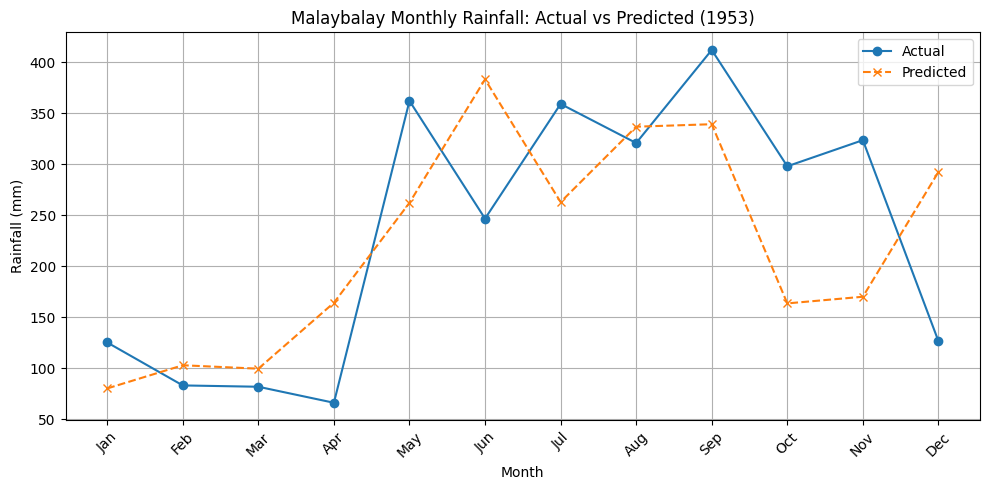

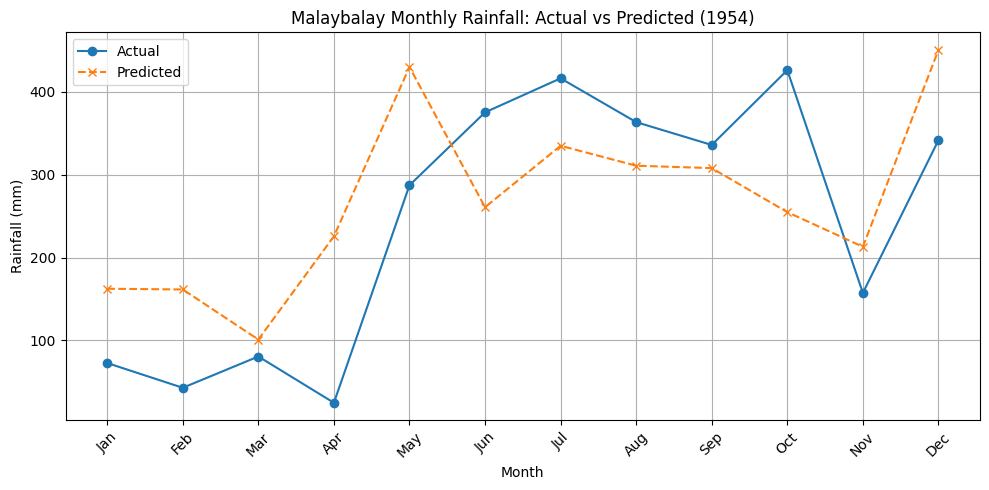

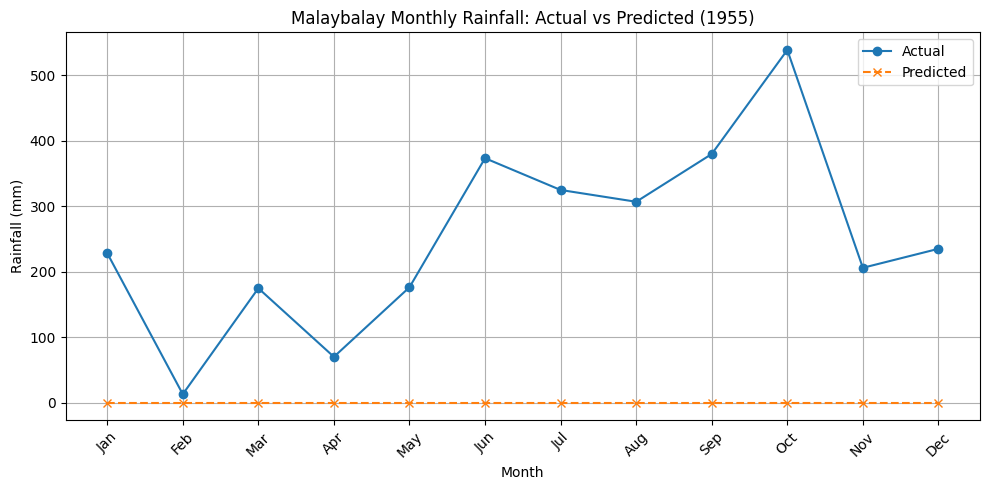

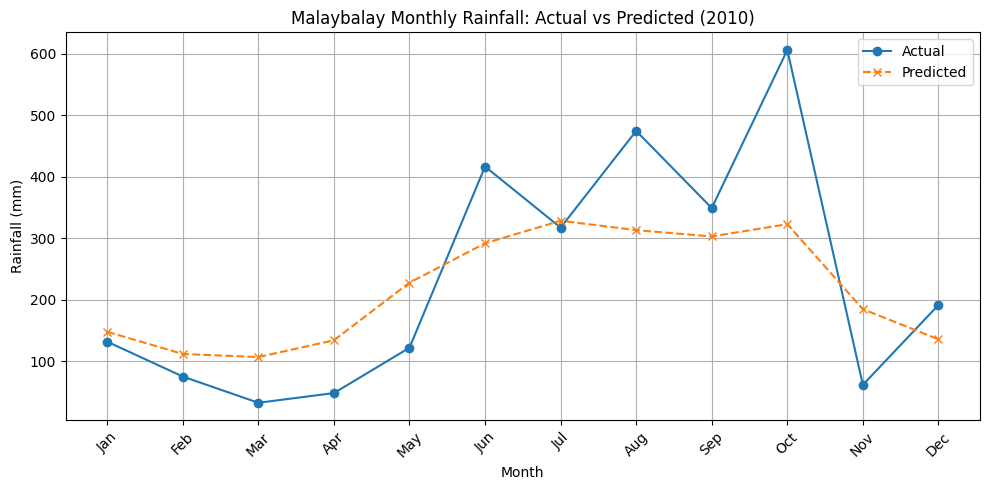

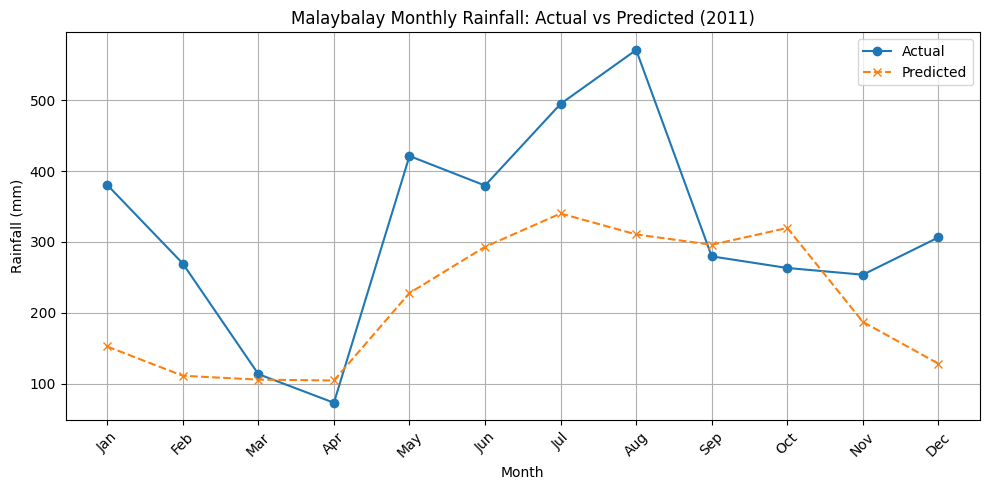

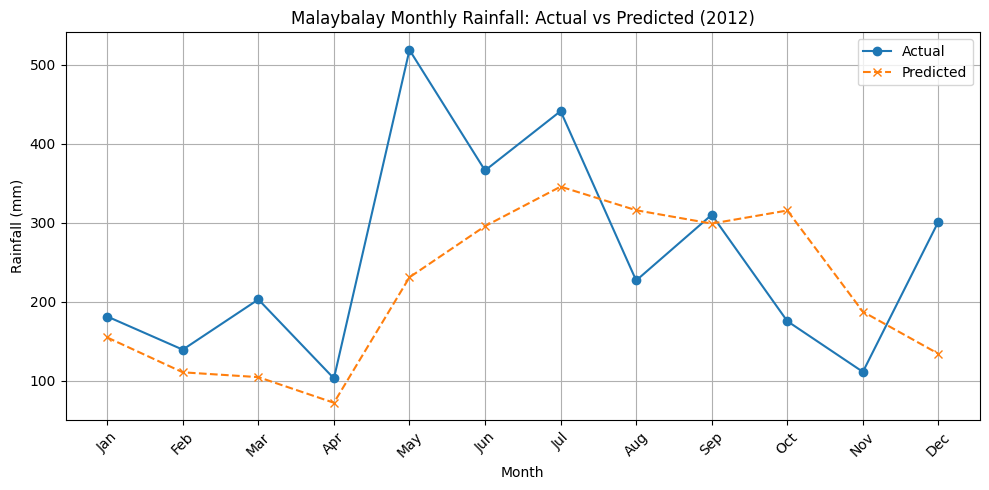

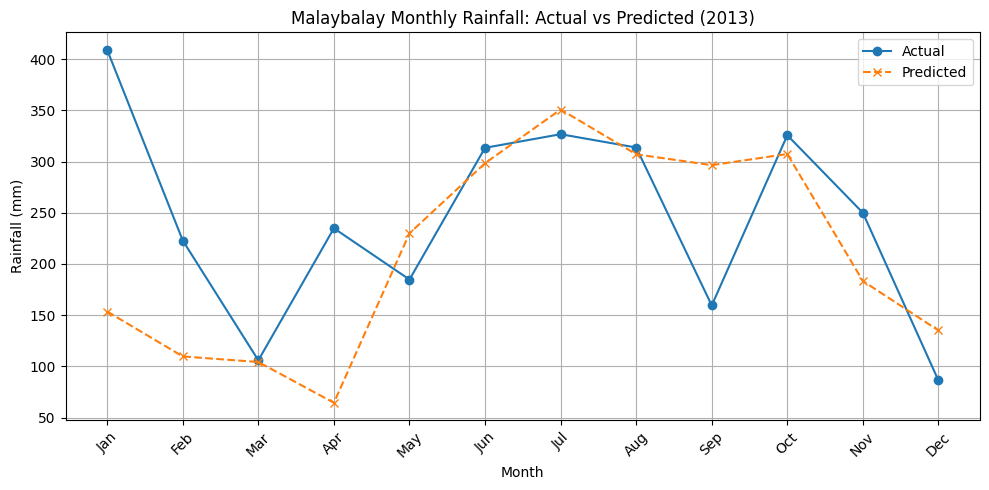

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from statsmodels.tsa.arima.model import ARIMA
import warnings
warnings.filterwarnings("ignore")

# === Load Dataset ===
df = pd.read_csv("RAINFALL.csv")
df.columns = df.columns.str.strip()

# Focus on one location
location = "Malaybalay"
df_loc = df[df['Location'] == location].copy()
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

df_loc = df_loc[['Year'] + months].set_index('Year')
df_loc = df_loc.apply(pd.to_numeric, errors='coerce')

# Reindex to full year range
full_years = pd.DataFrame(index=range(df_loc.index.min(), df_loc.index.max() + 1))
df_full = full_years.join(df_loc)

# Store actual values before masking
actual_early = df_full.loc[1952:1955].copy()
actual_late = df_full.loc[2010:2013].copy()

# Mask years to predict
df_full.loc[1952:1955] = np.nan
df_full.loc[2010:2013] = np.nan

# Helper functions
def create_sequences(data, look_back=5):
    X, y = [], []
    for i in range(look_back, len(data)):
        if not np.isnan(data[i-look_back:i+1]).any():
            X.append(data[i-look_back:i])
            y.append(data[i])
    return np.array(X), np.array(y)

def lstm_forecast(model, series_scaled, start_idx, steps=4):
    seq = series_scaled[start_idx - 5:start_idx].flatten()
    preds = []
    for _ in range(steps):
        pred = model.predict(seq.reshape(1, -1, 1), verbose=0)[0][0]
        preds.append(pred)
        seq = np.append(seq[1:], pred)
    return scaler.inverse_transform(np.array(preds).reshape(-1, 1)).flatten()

def arima_hindcast(series, steps=4):
    model = ARIMA(series.dropna(), order=(5, 1, 0)).fit()
    reverse = model.predict(start=0, end=steps - 1)[::-1]  # simulate hindcast
    return reverse

# Main loop per month
predictions = {}
metrics = {}

for month in months:
    print(f"Processing {month}...")

    series = df_full[month].copy()
    series_scaled = MinMaxScaler()
    series_filled = series.copy()
    series_filled.loc[1952:1955] = np.nan  # ensure missing

    scaler = MinMaxScaler()
    series_scaled = scaler.fit_transform(series.values.reshape(-1, 1))

    # === LSTM Forecast (2010–2013)
    X_seq, y_seq = create_sequences(series_scaled, 5)
    if len(X_seq) < 5:
        continue
    X_lstm = X_seq.reshape(X_seq.shape[0], X_seq.shape[1], 1)

    model = Sequential([
        LSTM(32, input_shape=(5, 1)),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_lstm, y_seq, epochs=100, verbose=0)

    forecast_start = df_full.index.get_loc(2010)
    lstm_pred = lstm_forecast(model, series_scaled, forecast_start, steps=4)

    # === ARIMA Hindcast (1952–1955)
    arima_series = df_full[month].copy()
    arima_series = arima_series.dropna()
    try:
        hind_pred = arima_hindcast(arima_series, 4)
    except:
        hind_pred = [np.nan] * 4

    # === Save predictions and compute metrics ===
    pred_years = list(range(1952, 1956)) + list(range(2010, 2014))
    actual = list(actual_early[month]) + list(actual_late[month])
    pred = list(hind_pred) + list(lstm_pred)

    predictions[month] = {
        'Year': pred_years,
        'Actual': actual,
        'Predicted': pred
    }

    # === Compute error metrics ===
    try:
        rmse = np.sqrt(mean_squared_error(actual, pred))
        mae = mean_absolute_error(actual, pred)
        metrics[month] = {'RMSE': rmse, 'MAE': mae}
    except:
        metrics[month] = {'RMSE': None, 'MAE': None}

# === Display metrics ===
print("\n📊 RMSE and MAE per Month:")
for month, vals in metrics.items():
    print(f"{month}: RMSE = {vals['RMSE']:.2f}, MAE = {vals['MAE']:.2f}" if vals['RMSE'] else f"{month}: insufficient data")

# === Plot Results per Year ===
combined = pd.concat({k: pd.DataFrame(v) for k, v in predictions.items()}, names=['Month']).reset_index()

for year in [1952, 1953, 1954, 1955, 2010, 2011, 2012, 2013]:
    plt.figure(figsize=(10, 5))
    data_year = combined[combined['Year'] == year]
    plt.plot(data_year['Month'], data_year['Actual'], label="Actual", marker='o')
    plt.plot(data_year['Month'], data_year['Predicted'], label="Predicted", marker='x', linestyle='--')
    plt.title(f"{location} Monthly Rainfall: Actual vs Predicted ({year})")
    plt.xlabel("Month")
    plt.ylabel("Rainfall (mm)")
    plt.grid(True)
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


Processing Jan...
Processing Feb...
Processing Mar...
Processing Apr...
Processing May...
Processing Jun...
Processing Jul...
Processing Aug...
Processing Sep...
Processing Oct...
Processing Nov...
Processing Dec...

📊 RMSE and MAE per Month and Model:

Jan:
  ARIMA → RMSE: 125.14, MAE: 95.74
  LSTM → RMSE: 174.09, MAE: 136.91
  GRU → RMSE: 180.29, MAE: 146.90
  LSTM-GRU → RMSE: 177.82, MAE: 135.94

Feb:
  ARIMA → RMSE: 65.27, MAE: 50.08
  LSTM → RMSE: 99.91, MAE: 85.10
  GRU → RMSE: 105.80, MAE: 93.48
  LSTM-GRU → RMSE: 100.02, MAE: 85.42

Mar:
  ARIMA → RMSE: 88.69, MAE: 56.57
  LSTM → RMSE: 61.12, MAE: 44.53
  GRU → RMSE: 61.54, MAE: 44.26
  LSTM-GRU → RMSE: 60.11, MAE: 43.98

Apr:
  ARIMA → RMSE: 122.95, MAE: 110.81
  LSTM → RMSE: 96.37, MAE: 77.52
  GRU → RMSE: 90.72, MAE: 71.68
  LSTM-GRU → RMSE: 90.49, MAE: 70.38

May:
  ARIMA → RMSE: 151.10, MAE: 147.96
  LSTM → RMSE: 182.65, MAE: 158.07
  GRU → RMSE: 181.92, MAE: 158.57
  LSTM-GRU → RMSE: 180.71, MAE: 158.12

Jun:
  ARIMA → RM

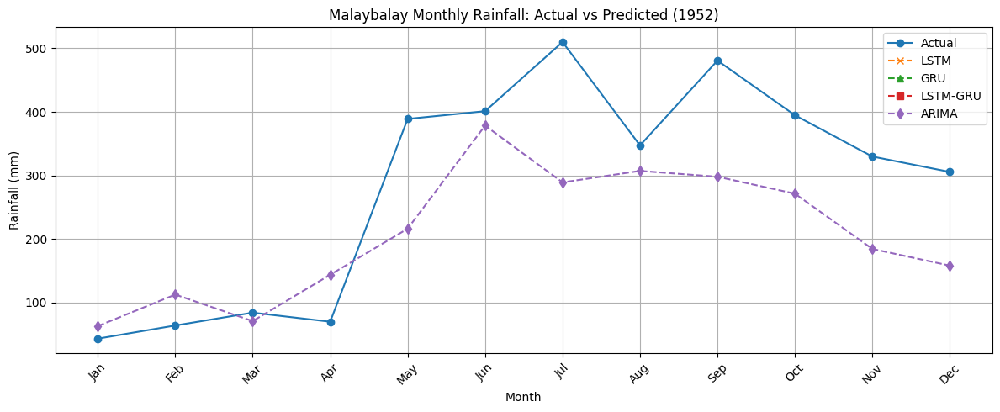

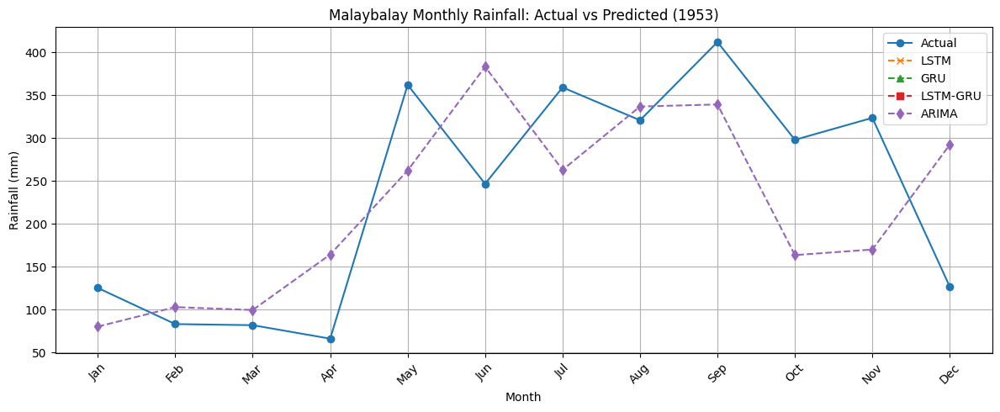

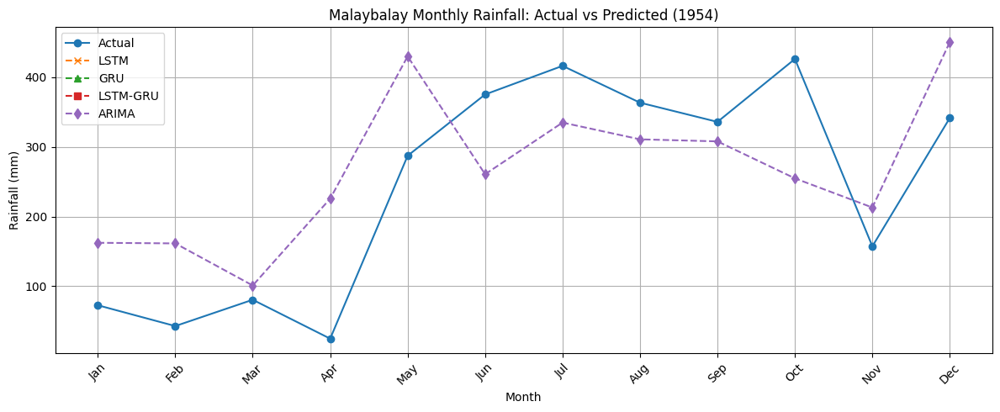

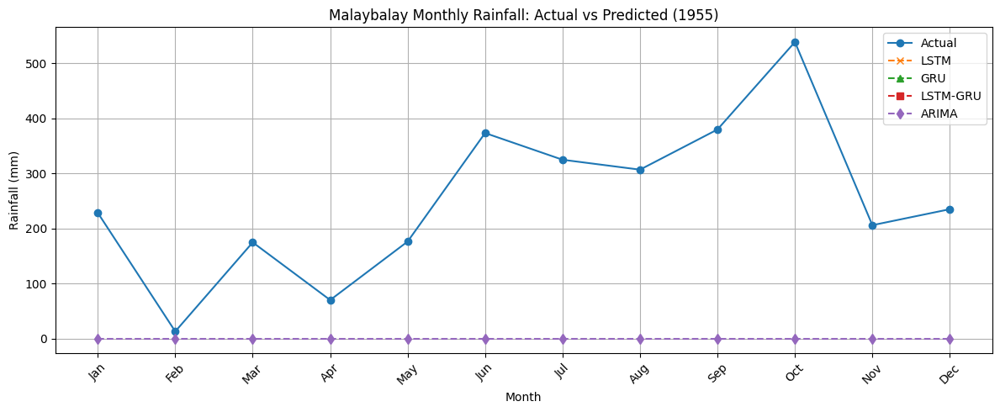

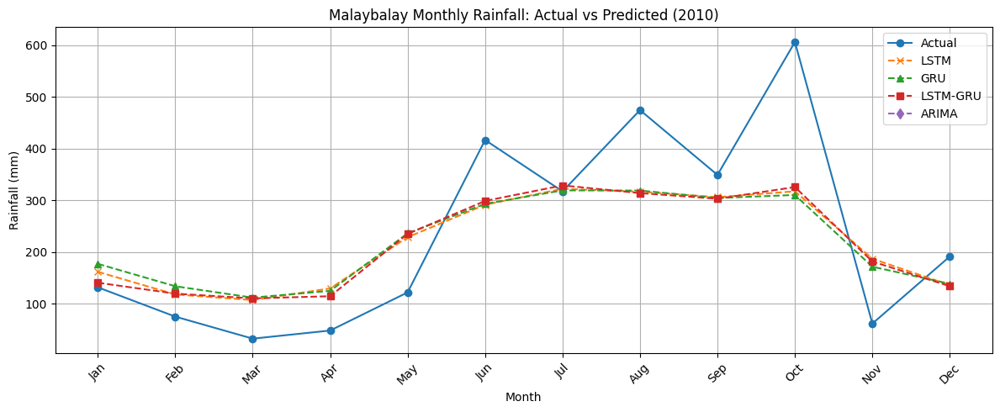

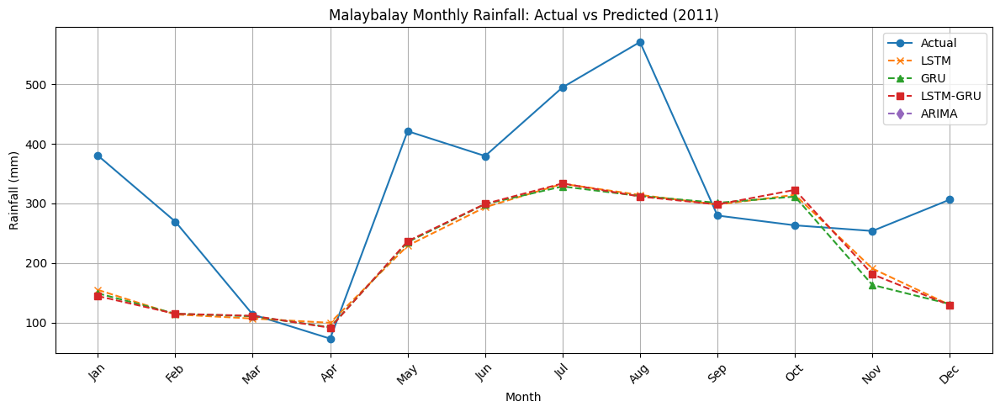

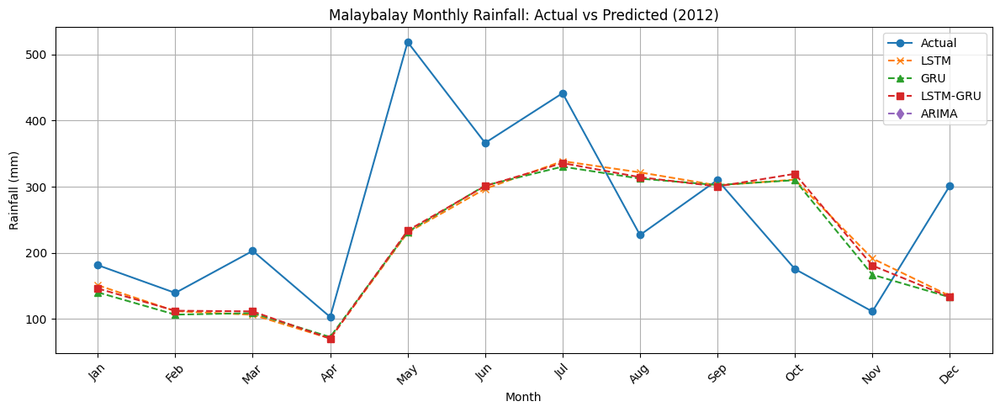

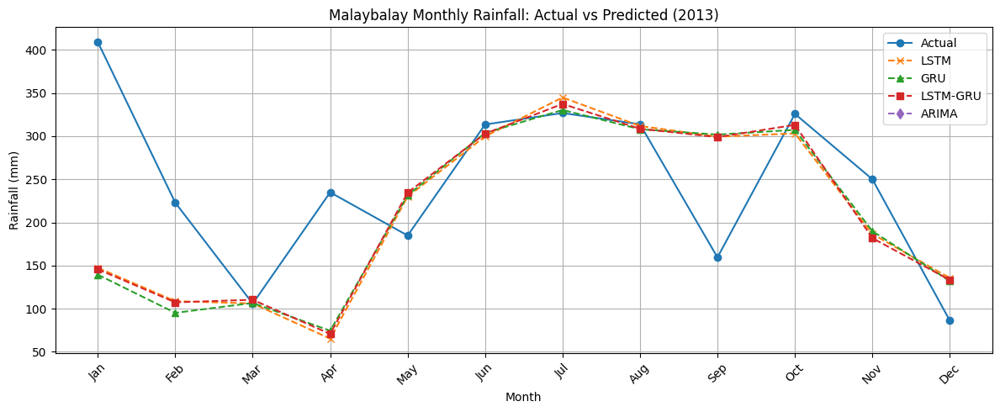

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense
from statsmodels.tsa.arima.model import ARIMA
import warnings
warnings.filterwarnings("ignore")

# === Load Dataset ===
df = pd.read_csv("RAINFALL.csv")
df.columns = df.columns.str.strip()

# Select one location
location = "Malaybalay"
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
df_loc = df[df['Location'] == location][['Year'] + months].set_index('Year')
df_loc = df_loc.apply(pd.to_numeric, errors='coerce')

# Reindex to ensure full range
df_full = pd.DataFrame(index=range(df_loc.index.min(), df_loc.index.max() + 1))
df_full = df_full.join(df_loc)

# Save actual values for metrics
actual_early = df_full.loc[1952:1955].copy()
actual_late = df_full.loc[2010:2013].copy()

# Mask for prediction
df_full.loc[1952:1955] = np.nan
df_full.loc[2010:2013] = np.nan

# Helper Functions
def create_sequences(data, look_back=5):
    X, y = [], []
    for i in range(look_back, len(data)):
        if not np.isnan(data[i-look_back:i+1]).any():
            X.append(data[i-look_back:i])
            y.append(data[i])
    return np.array(X), np.array(y)

def forecast_model(model, last_seq, steps=4):
    forecast = []
    seq = last_seq.copy()
    for _ in range(steps):
        pred = model.predict(seq.reshape(1, -1, 1), verbose=0)[0][0]
        forecast.append(pred)
        seq = np.append(seq[1:], pred)
    return forecast

def arima_hindcast(series, steps=4):
    model = ARIMA(series.dropna(), order=(5, 1, 0)).fit()
    pred = model.predict(start=0, end=steps - 1)[::-1]
    return pred

# Main Prediction Loop
results = {}
metrics = {}

for month in months:
    print(f"Processing {month}...")

    raw_series = df_full[month].copy()
    actual = list(actual_early[month]) + list(actual_late[month])

    scaler = MinMaxScaler()
    series_scaled = scaler.fit_transform(raw_series.values.reshape(-1, 1))

    X_seq, y_seq = create_sequences(series_scaled, 5)
    if len(X_seq) < 5:
        continue

    X_seq_3d = X_seq.reshape(X_seq.shape[0], X_seq.shape[1], 1)

    # === Train LSTM ===
    lstm = Sequential([LSTM(32, input_shape=(5, 1)), Dense(1)])
    lstm.compile(optimizer='adam', loss='mse')
    lstm.fit(X_seq_3d, y_seq, epochs=100, verbose=0)

    # === Train GRU ===
    gru = Sequential([GRU(32, input_shape=(5, 1)), Dense(1)])
    gru.compile(optimizer='adam', loss='mse')
    gru.fit(X_seq_3d, y_seq, epochs=100, verbose=0)

    # === Train LSTM–GRU Hybrid ===
    hybrid = Sequential([
        LSTM(16, return_sequences=True, input_shape=(5, 1)),
        GRU(16),
        Dense(1)
    ])
    hybrid.compile(optimizer='adam', loss='mse')
    hybrid.fit(X_seq_3d, y_seq, epochs=100, verbose=0)

    # === Forecast from 2010 ===
    forecast_start_idx = df_full.index.get_loc(2010)
    last_seq = series_scaled[forecast_start_idx - 5:forecast_start_idx].flatten()

    lstm_pred = scaler.inverse_transform(np.array(forecast_model(lstm, last_seq, 4)).reshape(-1, 1)).flatten()
    gru_pred = scaler.inverse_transform(np.array(forecast_model(gru, last_seq, 4)).reshape(-1, 1)).flatten()
    hybrid_pred = scaler.inverse_transform(np.array(forecast_model(hybrid, last_seq, 4)).reshape(-1, 1)).flatten()

    # === ARIMA Hindcast from later years ===
    try:
        arima_pred = arima_hindcast(raw_series, 4)
    except:
        arima_pred = [np.nan]*4

    # Store results
    pred_years = list(range(1952, 1956)) + list(range(2010, 2014))
    results[month] = {
        "Year": pred_years,
        "Actual": actual,
        "ARIMA": list(arima_pred) + [np.nan]*4,
        "LSTM": [np.nan]*4 + list(lstm_pred),
        "GRU": [np.nan]*4 + list(gru_pred),
        "LSTM-GRU": [np.nan]*4 + list(hybrid_pred)
    }

    # Compute errors
    pred_models = ["ARIMA", "LSTM", "GRU", "LSTM-GRU"]
    metrics[month] = {}
    for model in pred_models:
        try:
            pred = np.array(results[month][model])
            true = np.array(results[month]["Actual"])
            valid = ~np.isnan(pred)
            rmse = np.sqrt(mean_squared_error(true[valid], pred[valid]))
            mae = mean_absolute_error(true[valid], pred[valid])
            metrics[month][model] = (rmse, mae)
        except:
            metrics[month][model] = (None, None)

# === Print Metrics ===
print("\n📊 RMSE and MAE per Month and Model:")
for month, model_metrics in metrics.items():
    print(f"\n{month}:")
    for model, (rmse, mae) in model_metrics.items():
        if rmse is not None:
            print(f"  {model} → RMSE: {rmse:.2f}, MAE: {mae:.2f}")
        else:
            print(f"  {model} → insufficient data")

# === Plot results per year ===
combined = pd.concat({k: pd.DataFrame(v) for k, v in results.items()}, names=["Month"]).reset_index()

for year in [1952, 1953, 1954, 1955, 2010, 2011, 2012, 2013]:
    plt.figure(figsize=(12, 5))
    data_year = combined[combined["Year"] == year]
    plt.plot(data_year["Month"], data_year["Actual"], label="Actual", marker="o")
    plt.plot(data_year["Month"], data_year["LSTM"], label="LSTM", linestyle="--", marker="x")
    plt.plot(data_year["Month"], data_year["GRU"], label="GRU", linestyle="--", marker="^")
    plt.plot(data_year["Month"], data_year["LSTM-GRU"], label="LSTM-GRU", linestyle="--", marker="s")
    plt.plot(data_year["Month"], data_year["ARIMA"], label="ARIMA", linestyle="--", marker="d")
    plt.title(f"{location} Monthly Rainfall: Actual vs Predicted ({year})")
    plt.xlabel("Month")
    plt.ylabel("Rainfall (mm)")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from statsmodels.tsa.arima.model import ARIMA
import warnings
warnings.filterwarnings("ignore")

# === Load Dataset ===
df = pd.read_csv("RAINFALL.csv")
df.columns = df.columns.str.strip()
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
locations = df['Location'].unique()

# === Create output directory for plots ===
os.makedirs("plots_forecast", exist_ok=True)

# === Helper Functions ===
def create_sequences(data, look_back=5):
    X, y = [], []
    for i in range(look_back, len(data)):
        if not np.isnan(data[i-look_back:i+1]).any():
            X.append(data[i-look_back:i])
            y.append(data[i])
    return np.array(X), np.array(y)

def forecast_model(model, last_seq, steps=3):
    forecast = []
    seq = last_seq.copy()
    for _ in range(steps):
        pred = model.predict(seq.reshape(1, -1, 1), verbose=0)[0][0]
        forecast.append(pred)
        seq = np.append(seq[1:], pred)
    return forecast

def arima_hindcast(series, steps=3):
    model = ARIMA(series.dropna(), order=(5, 1, 0)).fit()
    pred = model.predict(start=0, end=steps - 1)[::-1]
    return pred

# === Loop Over All Locations ===
for location in locations:
    print(f"\n📍 Processing: {location}")
    df_loc = df[df['Location'] == location][['Year'] + months].copy()
    df_loc = df_loc.groupby('Year').mean().apply(pd.to_numeric, errors='coerce')
    df_loc = df_loc.reindex(range(df_loc.index.min(), df_loc.index.max() + 1))

    # Skip short datasets
    years = df_loc.index.tolist()
    if len(years) < 10:
        print(f"⛔ Skipping {location} — insufficient data.")
        continue

    early_years = years[:3]
    late_years = years[-3:]

    df_early = df_loc.loc[early_years]
    df_late = df_loc.loc[late_years]

    df_work = df_loc.copy()
    df_work.loc[early_years] = np.nan
    df_work.loc[late_years] = np.nan

    results = {}

    for month in months:
        series = df_work[month]
        if series.isna().sum() > 0.5 * len(series):
            continue  # skip sparse months

        scaler = MinMaxScaler()
        try:
            series_scaled = scaler.fit_transform(series.values.reshape(-1, 1))
        except:
            continue

        X_seq, y_seq = create_sequences(series_scaled)
        if len(X_seq) < 5:
            continue
        X_seq_3d = X_seq.reshape(X_seq.shape[0], X_seq.shape[1], 1)

        # Train LSTM
        model = Sequential([LSTM(32, input_shape=(5, 1)), Dense(1)])
        model.compile(optimizer='adam', loss='mse')
        model.fit(X_seq_3d, y_seq, epochs=100, verbose=0)

        # Forecast last 3 years
        try:
            start_forecast = len(series_scaled) - 3
            seq_fore = series_scaled[start_forecast - 5:start_forecast].flatten()
            lstm_fore = scaler.inverse_transform(
                np.array(forecast_model(model, seq_fore, 3)).reshape(-1, 1)
            ).flatten()
        except:
            lstm_fore = [np.nan] * 3

        # Hindcast first 3 years using ARIMA
        try:
            arima_pred = arima_hindcast(df_loc[month], 3)
        except:
            arima_pred = [np.nan] * 3

        # Validation before saving
        actual_early = df_early[month].values.tolist()
        actual_late = df_late[month].values.tolist()

        if (
            len(actual_early) == 3 and len(actual_late) == 3 and
            len(arima_pred) == 3 and len(lstm_fore) == 3 and
            not pd.isna(actual_early).any() and not pd.isna(actual_late).any()
        ):
            results[month] = {
                'Year': early_years + late_years,
                'Actual': actual_early + actual_late,
                'ARIMA': list(arima_pred) + [np.nan] * 3,
                'LSTM': [np.nan] * 3 + list(lstm_fore)
            }

    # Skip if no valid results
    if not results:
        print(f"⚠️ No valid monthly predictions for {location}, skipping plot/metrics.")
        continue

    # === Plot & Compute Metrics ===
    full_df = pd.concat({k: pd.DataFrame(v) for k, v in results.items()}, names=["Month"]).reset_index()

    for year in early_years + late_years:
        yearly = full_df[full_df["Year"] == year]
        if yearly.empty:
            continue

        plt.figure(figsize=(10, 5))
        plt.plot(yearly["Month"], yearly["Actual"], label="Actual", marker="o")
        plt.plot(yearly["Month"], yearly["LSTM"], label="LSTM Forecast", marker="x")
        plt.plot(yearly["Month"], yearly["ARIMA"], label="ARIMA Hindcast", marker="^")
        plt.title(f"{location} - Monthly Rainfall Forecast vs Actual ({year})")
        plt.xlabel("Month")
        plt.ylabel("Rainfall (mm)")
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.savefig(f"plots_forecast/{location}_{year}.png")
        plt.close()

    print(f"✅ Saved plots for {location}.")

    # === Compute RMSE and MAE ===
    print("📊 RMSE and MAE:")
    for month, values in results.items():
        actual = np.array(values['Actual'])
        for model in ['LSTM', 'ARIMA']:
            pred = np.array(values[model])
            valid = ~np.isnan(pred)
            if valid.sum() == 0:
                continue
            rmse = np.sqrt(mean_squared_error(actual[valid], pred[valid]))
            mae = mean_absolute_error(actual[valid], pred[valid])
            print(f"{month} - {model}: RMSE={rmse:.2f}, MAE={mae:.2f}")



📍 Processing: Malaybalay
✅ Saved plots for Malaybalay.
📊 RMSE and MAE:
Jan - LSTM: RMSE=201.43, MAE=173.91
Jan - ARIMA: RMSE=67.21, MAE=64.56
Feb - LSTM: RMSE=115.39, MAE=102.04
Feb - ARIMA: RMSE=27.61, MAE=23.88
Mar - LSTM: RMSE=53.92, MAE=33.10
Mar - ARIMA: RMSE=46.43, MAE=27.72
Apr - LSTM: RMSE=105.31, MAE=77.88
Apr - ARIMA: RMSE=14.31, MAE=9.94
May - LSTM: RMSE=210.19, MAE=180.14
May - ARIMA: RMSE=166.75, MAE=109.48
Jun - LSTM: RMSE=54.43, MAE=44.10
Jun - ARIMA: RMSE=236.55, MAE=197.34
Jul - LSTM: RMSE=115.10, MAE=96.64
Jul - ARIMA: RMSE=259.10, MAE=214.69
Aug - LSTM: RMSE=156.38, MAE=122.95
Aug - ARIMA: RMSE=210.56, MAE=134.43
Sep - LSTM: RMSE=89.98, MAE=62.10
Sep - ARIMA: RMSE=198.06, MAE=142.64
Oct - LSTM: RMSE=105.38, MAE=85.02
Oct - ARIMA: RMSE=255.16, MAE=196.25
Nov - LSTM: RMSE=69.99, MAE=69.97
Nov - ARIMA: RMSE=90.79, MAE=54.46
Dec - LSTM: RMSE=142.14, MAE=130.89
Dec - ARIMA: RMSE=226.73, MAE=199.29

📍 Processing: Lumbia
✅ Saved plots for Lumbia.
📊 RMSE and MAE:
Jan - LSTM

In [1]:
import pandas as pd
import numpy as np
import os
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, GRU, Dense, Bidirectional, Input, LayerNormalization, MultiHeadAttention, Dropout
import plotly.express as px
from statsmodels.tsa.arima.model import ARIMA
import warnings
warnings.filterwarnings("ignore")

# === Helper Functions ===
def create_sequences(data, look_back=5):
    X, y = [], []
    for i in range(look_back, len(data)):
        if not np.isnan(data[i-look_back:i+1]).any():
            X.append(data[i-look_back:i])
            y.append(data[i])
    return np.array(X), np.array(y)

def forecast_model(model, last_seq, steps=3):
    forecast = []
    seq = last_seq.copy()
    for _ in range(steps):
        pred = model.predict(seq.reshape(1, -1, 1), verbose=0)[0][0]
        forecast.append(pred)
        seq = np.append(seq[1:], pred)
    return forecast

def arima_hindcast(series, steps=3):
    model = ARIMA(series.dropna(), order=(5, 1, 0)).fit()
    pred = model.predict(start=0, end=steps - 1)[::-1]
    return pred

def transformer_model(input_shape):
    inputs = Input(shape=input_shape)
    x = LayerNormalization()(inputs)
    x = MultiHeadAttention(num_heads=2, key_dim=16)(x, x)
    x = Dropout(0.1)(x)
    x = Dense(1)(x[:, -1])
    model = Model(inputs, x)
    model.compile(optimizer='adam', loss='mse')
    return model

# === Load Data ===
df = pd.read_csv("RAINFALL.csv")
df.columns = df.columns.str.strip()
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
locations = df['Location'].unique()

forecast_records = []
error_records = []

for location in locations:
    print(f"\n📍 Processing: {location}")
    df_loc = df[df['Location'] == location][['Year'] + months].copy()
    df_loc = df_loc.groupby('Year').mean().apply(pd.to_numeric, errors='coerce')
    df_loc = df_loc.reindex(range(df_loc.index.min(), df_loc.index.max() + 1))

    if len(df_loc) < 10:
        continue

    early_years = df_loc.index[:3].tolist()
    late_years = df_loc.index[-3:].tolist()
    df_early = df_loc.loc[early_years]
    df_late = df_loc.loc[late_years]
    df_work = df_loc.copy()
    df_work.loc[early_years + late_years] = np.nan

    for month in months:
        series = df_work[month]
        if series.isna().sum() > 0.5 * len(series):
            continue

        scaler = MinMaxScaler()
        try:
            series_scaled = scaler.fit_transform(series.values.reshape(-1, 1))
        except:
            continue

        X_seq, y_seq = create_sequences(series_scaled)
        if len(X_seq) < 5:
            continue

        X_seq_3d = X_seq.reshape(X_seq.shape[0], X_seq.shape[1], 1)

        # === Models ===
        def build_and_train(model):
            model.compile(optimizer='adam', loss='mse')
            model.fit(X_seq_3d, y_seq, epochs=100, verbose=0)
            return model

        lstm = build_and_train(Sequential([LSTM(32, input_shape=(5, 1)), Dense(1)]))
        gru = build_and_train(Sequential([GRU(32, input_shape=(5, 1)), Dense(1)]))
        hybrid = build_and_train(Sequential([LSTM(16, return_sequences=True, input_shape=(5, 1)), GRU(16), Dense(1)]))
        bilstm = build_and_train(Sequential([Bidirectional(LSTM(32)), Dense(1)]))
        trans = transformer_model((5, 1))
        trans.fit(X_seq_3d, y_seq, epochs=100, verbose=0)

        # === Forecast ===
        idx = len(series_scaled) - 3
        seq_fore = series_scaled[idx - 5:idx].flatten()

        lstm_fore = scaler.inverse_transform(np.array(forecast_model(lstm, seq_fore, 3)).reshape(-1, 1)).flatten()
        gru_fore = scaler.inverse_transform(np.array(forecast_model(gru, seq_fore, 3)).reshape(-1, 1)).flatten()
        hybrid_fore = scaler.inverse_transform(np.array(forecast_model(hybrid, seq_fore, 3)).reshape(-1, 1)).flatten()
        bilstm_fore = scaler.inverse_transform(np.array(forecast_model(bilstm, seq_fore, 3)).reshape(-1, 1)).flatten()
        trans_fore = scaler.inverse_transform(np.array(forecast_model(trans, seq_fore, 3)).reshape(-1, 1)).flatten()

        try:
            arima_pred = arima_hindcast(df_loc[month], 3)
        except:
            arima_pred = [np.nan]*3

        actual = df_early[month].tolist() + df_late[month].tolist()
        models = {
            'ARIMA': list(arima_pred) + [np.nan]*3,
            'LSTM': [np.nan]*3 + list(lstm_fore),
            'GRU': [np.nan]*3 + list(gru_fore),
            'LSTM-GRU': [np.nan]*3 + list(hybrid_fore),
            'BiLSTM': [np.nan]*3 + list(bilstm_fore),
            'Transformer': [np.nan]*3 + list(trans_fore)
        }

        # Store Predictions and Errors
        for i, year in enumerate(early_years + late_years):
            for model_name, preds in models.items():
                forecast_records.append({
                    'Location': location, 'Month': month, 'Year': year,
                    'Model': model_name, 'Actual': actual[i], 'Predicted': preds[i]
                })
        for model_name, preds in models.items():
            pred_arr = np.array(preds)
            act_arr = np.array(actual)
            valid = ~np.isnan(pred_arr)
            if valid.sum() == 0: continue
            rmse = np.sqrt(mean_squared_error(act_arr[valid], pred_arr[valid]))
            mae = mean_absolute_error(act_arr[valid], pred_arr[valid])
            error_records.append({
                'Location': location, 'Month': month, 'Model': model_name,
                'RMSE': rmse, 'MAE': mae
            })

        # === Interactive Plot ===
        plot_df = pd.DataFrame({
            'Year': early_years + late_years,
            'Actual': actual,
            'LSTM': models['LSTM'],
            'GRU': models['GRU'],
            'ARIMA': models['ARIMA'],
            'LSTM-GRU': models['LSTM-GRU'],
            'BiLSTM': models['BiLSTM'],
            'Transformer': models['Transformer'],
            'Month': [month] * 6
        })
        fig = px.line(plot_df, x="Month", y=["Actual", "LSTM", "GRU", "ARIMA", "LSTM-GRU", "BiLSTM", "Transformer"],
                      title=f"{location} {month} Forecast/Hindcast", markers=True)
        fig.write_html(f"{location}_{month}.html")

# === Export Results ===
pd.DataFrame(forecast_records).to_csv("forecast_results.csv", index=False)
pd.DataFrame(error_records).to_csv("forecast_errors.csv", index=False)

print("✅ Forecasting and Hindcasting completed. Results saved.")



📍 Processing: Malaybalay


2025-06-19 10:22:07.695974: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz



📍 Processing: Lumbia

📍 Processing: Kisolon

📍 Processing: PhilipsManolo

📍 Processing: MalukoManolo

📍 Processing: Sasa

📍 Processing: BagoOshiro

📍 Processing: Impasug-ong

📍 Processing: Damilag
✅ Forecasting and Hindcasting completed. Results saved.


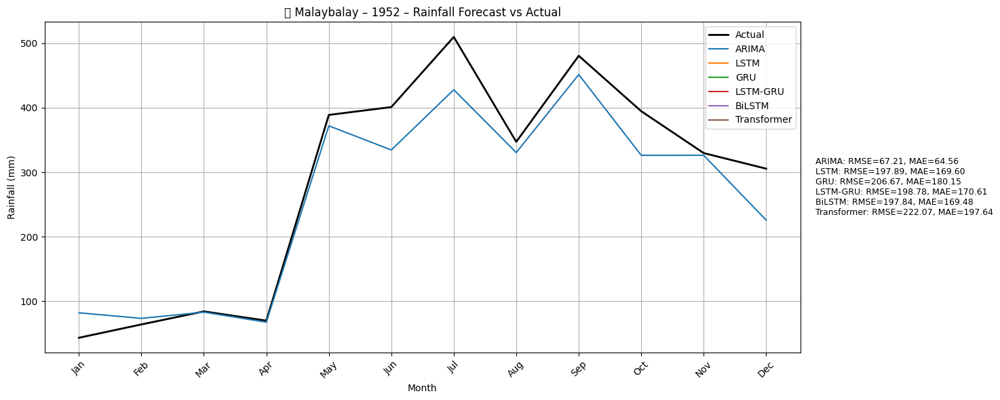

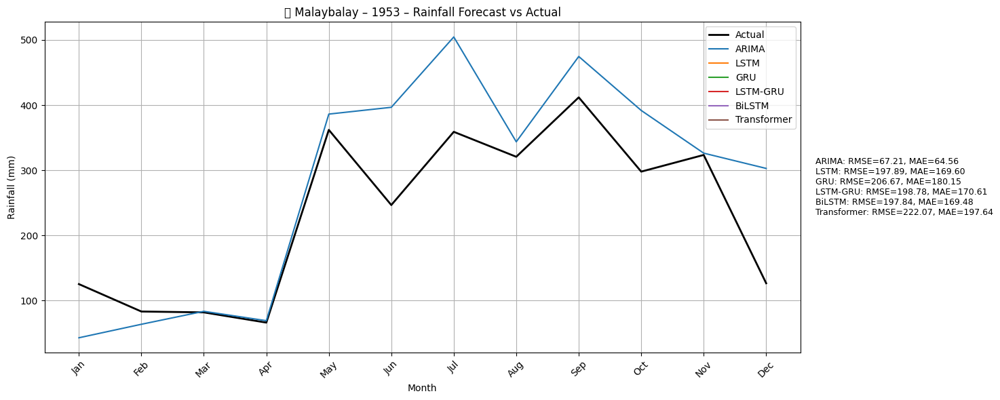

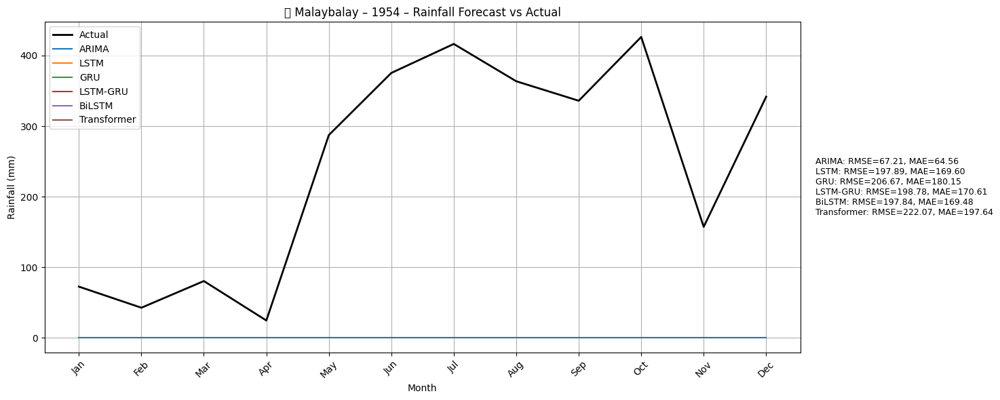

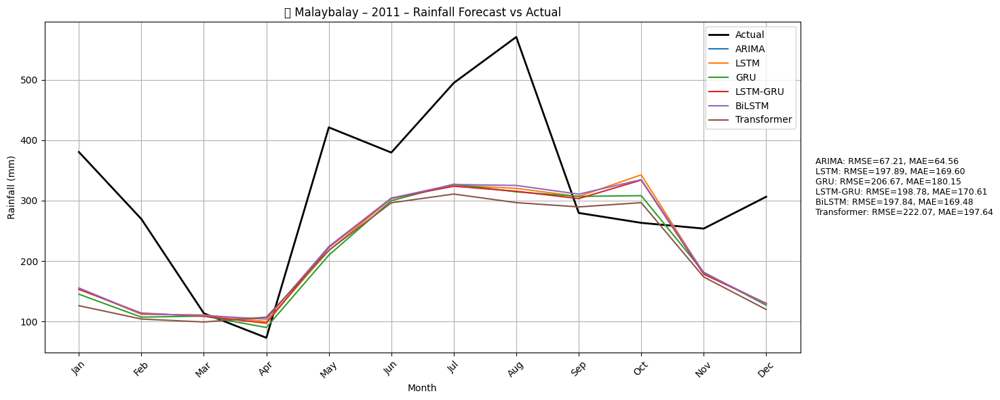

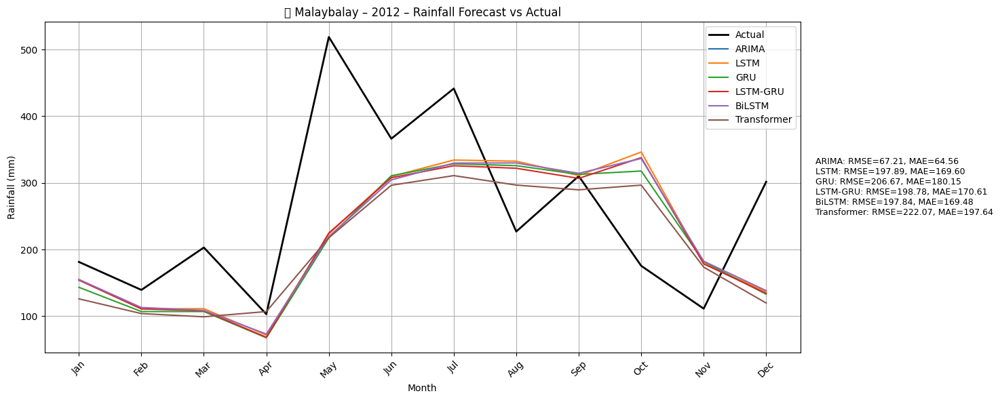

...

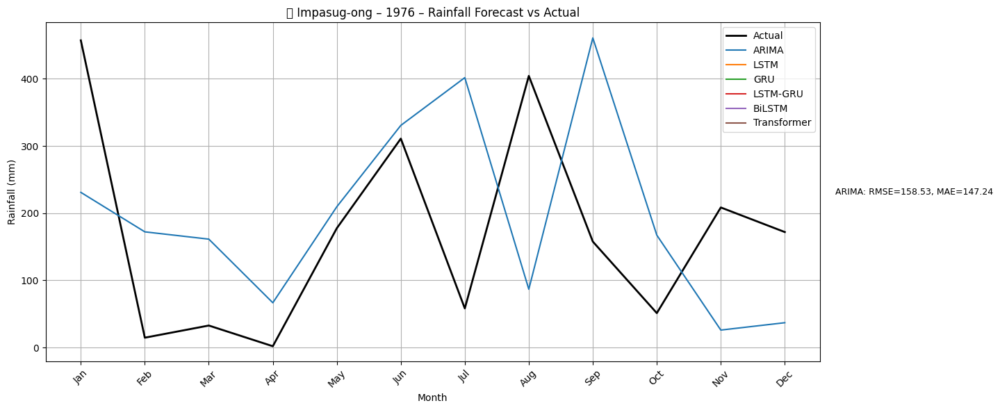

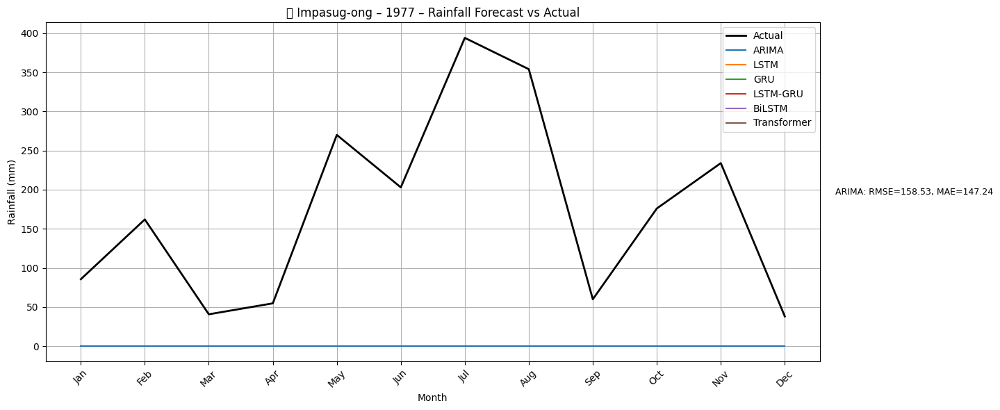

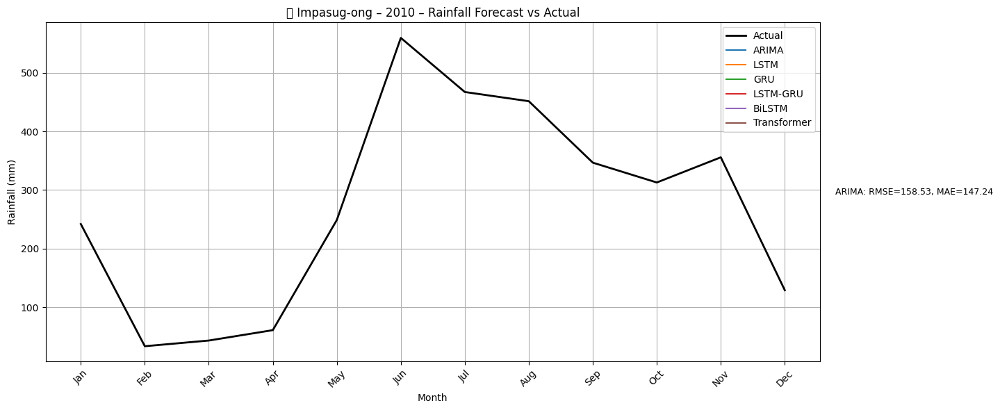

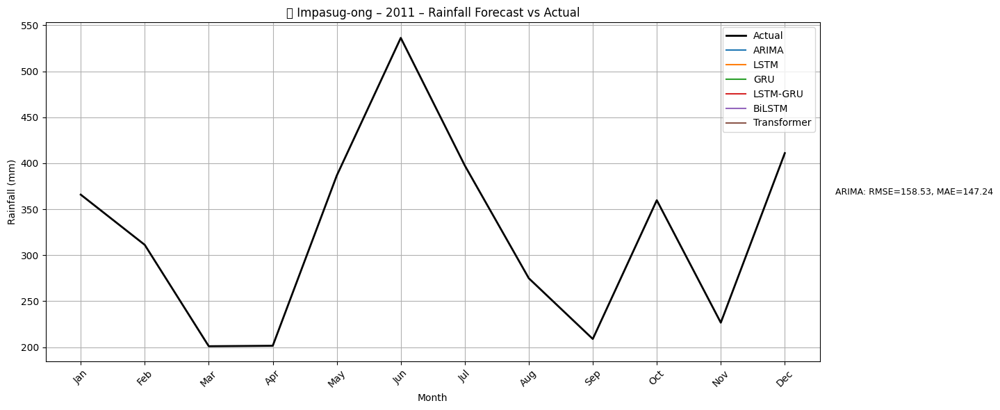

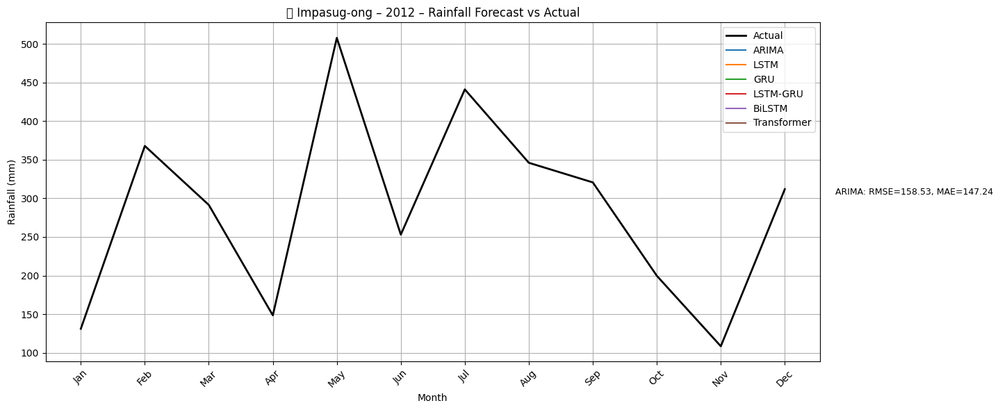

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
forecast_df = pd.read_csv("forecast_results.csv")
error_df = pd.read_csv("forecast_errors.csv")

# Settings
months_order = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
models = ['ARIMA', 'LSTM', 'GRU', 'LSTM-GRU', 'BiLSTM', 'Transformer']
locations = forecast_df['Location'].unique()

# === Start Visualization ===
for location in locations:
    loc_df = forecast_df[forecast_df['Location'] == location]
    years = loc_df['Year'].unique()

    for year in sorted(years):
        year_df = loc_df[loc_df['Year'] == year]

        if year_df.empty:
            continue

        plt.figure(figsize=(12, 6))
        actual = year_df.drop_duplicates(subset=["Month"])[['Month', 'Actual']]
        actual = actual.set_index("Month").reindex(months_order).reset_index()

        plt.plot(months_order, actual['Actual'], label='Actual', color='black', linewidth=2)

        for model in models:
            model_df = year_df[year_df["Model"] == model]
            if not model_df.empty:
                pred = model_df.set_index("Month").reindex(months_order).reset_index()
                plt.plot(months_order, pred['Predicted'], label=model)

        # === Annotate Errors if available ===
        if 'Year' in error_df.columns:
            error_row = error_df[(error_df['Location'] == location) & (error_df['Year'] == year)]
        else:
            error_row = error_df[error_df['Location'] == location]

        if not error_row.empty:
            annotations = []
            for model in models:
                row = error_row[error_row['Model'] == model]
                if not row.empty:
                    rmse = row['RMSE'].values[0]
                    mae = row['MAE'].values[0]
                    annotations.append(f"{model}: RMSE={rmse:.2f}, MAE={mae:.2f}")
            annotation_text = "\n".join(annotations)
            plt.gcf().text(1.02, 0.5, annotation_text, fontsize=9, verticalalignment='center', transform=plt.gca().transAxes)

        plt.title(f"📍 {location} – {year} – Rainfall Forecast vs Actual")
        plt.xlabel("Month")
        plt.ylabel("Rainfall (mm)")
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()
